In [55]:
# Import libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import re
import torch
from babel.dates import time_
from transformers import pipeline
import sklearn
from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from tslearn.metrics import cdist_dtw
from scipy.stats import pearsonr
from tslearn.preprocessing import TimeSeriesScalerMeanVariance
from sklearn.cluster import AgglomerativeClustering
from tslearn.clustering import TimeSeriesKMeans

In [3]:
full_df = pd.read_csv('final_df_with_emotions.csv')

In [68]:
print(f"Full data frame shape: {full_df.shape}")

Full data frame shape: (211940, 29)


,song_artist,popularity,year,genre,danceability,energy,key,loudness,mode,speechiness,...,stride,window_index,window_text,anger,disgust,fear,joy,neutral,sadness,surprise
0,i won't give up - jason mraz,68,2012,acoustic,0.483,0.303,4,-10.058,1,0.0429,...,15,0,when i look into your eyes it's like watching ...,0.002872,0.000694,0.014730,0.932730,0.012456,0.013844,0.022674
1,i won't give up - jason mraz,68,2012,acoustic,0.483,0.303,4,-10.058,1,0.0429,...,15,1,sunrise there's so much they hold and just lik...,0.005971,0.004903,0.003788,0.012387,0.654966,0.028482,0.289503
2,i won't give up - jason mraz,68,2012,acoustic,0.483,0.303,4,-10.058,1,0.0429,...,15,2,you've come so far to be right where you are h...,0.008515,0.006889,0.004271,0.003231,0.741992,0.009496,0.225607
3,i won't give up - jason mraz,68,2012,acoustic,0.483,0.303,4,-10.058,1,0.0429,...,15,3,"i won't give up on us, even if the skies get r...",0.088137,0.002622,0.012525,0.542928,0.005592,0.346509,0.001687
4,i won't give up - jason mraz,68,2012,acoustic,0.483,0.303,4,-10.058,1,0.0429,...,15,4,"all my love, i'm still looking up and when you...",0.006475,0.004126,0.003085,0.054925,0.664923,0.196760,0.069705
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
211935,no one makes it on her own - roxette,10,2011,swedish,0.522,0.526,7,-6.248,1,0.0250,...,11,15,us together something 'bout your face your lip...,0.071852,0.006750,0.002511,0.828376,0.063367,0.014159,0.012984
211936,no one makes it on her own - roxette,10,2011,swedish,0.522,0.526,7,-6.248,1,0.0250,...,11,16,alone have you ever been in love and thought i...,0.008906,0.002125,0.027365,0.007867,0.150456,0.104639,0.698642
211937,no one makes it on her own - roxette,10,2011,swedish,0.522,0.526,7,-6.248,1,0.0250,...,11,17,then you know no one makes it on her own nobod...,0.273198,0.162422,0.026980,0.009971,0.337697,0.041970,0.147762
211938,no one makes it on her own - roxette,10,2011,swedish,0.522,0.526,7,-6.248,1,0.0250,...,11,18,it on her own nobody makes it nobody makes it ...,0.284669,0.016174,0.009253,0.007213,0.638420,0.027961,0.016311


In [19]:
# Step 1: Identify unique songs
df = full_df
unique_songs = df['song_artist'].unique()

# Step 2: Split the songs into training (80%) and remaining (20%) sets
train_songs, remaining_songs = train_test_split(
    unique_songs, test_size=0.2, random_state=42
)

# Step 3: Split the remaining 20% into tuning (10%) and testing (10%)
tune_songs, test_songs = train_test_split(
    remaining_songs, test_size=0.5, random_state=42
)

# Step 4: Create dataframes for training, tuning, and testing
train_df = df[df['song_artist'].isin(train_songs)].reset_index(drop=True)
tune_df = df[df['song_artist'].isin(tune_songs)].reset_index(drop=True)
test_df = df[df['song_artist'].isin(test_songs)].reset_index(drop=True)

In [20]:
# overall preview of the data
train_df.describe(include='all')

,song_artist,popularity,year,genre,danceability,energy,key,loudness,mode,speechiness,...,stride,window_index,window_text,anger,disgust,fear,joy,neutral,sadness,surprise
count,169540,169540.000000,169540.000000,169540,169540.000000,169540.000000,169540.000000,169540.000000,169540.000000,169540.000000,...,169540.000000,169540.000000,169540,169540.000000,169540.000000,169540.000000,169540.000000,169540.000000,169540.000000,169540.000000
unique,8477,NaN,NaN,51,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,166953,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,93 million miles - jason mraz,NaN,NaN,dance,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,kiss to send us off a kiss to send us off a,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,20,NaN,NaN,18140,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,7,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,29.092014,2007.983603,NaN,0.526629,0.673773,5.216350,-7.357155,0.713342,0.066021,...,11.494633,9.500000,NaN,0.116529,0.034003,0.076758,0.139382,0.289804,0.198193,0.145330
std,NaN,16.768041,5.796115,NaN,0.150801,0.234170,3.539958,3.334543,0.452202,0.066817,...,5.750122,5.766298,NaN,0.216533,0.091088,0.183999,0.257432,0.290968,0.285297,0.217284
min,NaN,0.000000,2000.000000,NaN,0.077000,0.000241,0.000000,-25.935000,0.000000,0.022100,...,2.000000,0.000000,NaN,0.000375,0.000093,0.000158,0.000226,0.000164,0.000601,0.000211
25%,NaN,16.000000,2003.000000,NaN,0.424000,0.505000,2.000000,-9.142000,0.000000,0.032200,...,7.000000,4.750000,NaN,0.008442,0.002853,0.004144,0.005904,0.035011,0.018008,0.012733
50%,NaN,27.000000,2007.000000,NaN,0.532000,0.717000,5.000000,-6.627000,1.000000,0.042000,...,10.000000,9.500000,NaN,0.022748,0.007725,0.011821,0.018200,0.172973,0.054094,0.047183
75%,NaN,40.000000,2012.000000,NaN,0.630000,0.876000,8.000000,-4.945000,1.000000,0.068400,...,14.000000,14.250000,NaN,0.090836,0.023769,0.043357,0.106239,0.511330,0.237869,0.170417


In [21]:
# takes in lens on emotional sentiment column data
sentiment_columns = ['anger', 'disgust', 'fear', 'joy', 'neutral', 'sadness', 'surprise']
train_df[sentiment_columns].describe()

,anger,disgust,fear,joy,neutral,sadness,surprise
count,169540.000000,169540.000000,169540.000000,169540.000000,169540.000000,169540.000000,169540.000000
mean,0.116529,0.034003,0.076758,0.139382,0.289804,0.198193,0.145330
std,0.216533,0.091088,0.183999,0.257432,0.290968,0.285297,0.217284
min,0.000375,0.000093,0.000158,0.000226,0.000164,0.000601,0.000211
25%,0.008442,0.002853,0.004144,0.005904,0.035011,0.018008,0.012733
50%,0.022748,0.007725,0.011821,0.018200,0.172973,0.054094,0.047183
75%,0.090836,0.023769,0.043357,0.106239,0.511330,0.237869,0.170417
max,0.995735,0.987877,0.996228,0.995322,0.975186,0.994649,0.986992


In [ ]:
for col in sentiment_columns:
    sns.histplot(train_df[col], kde=True)
    plt.title(f'Distribution of {col}')
    plt.show()

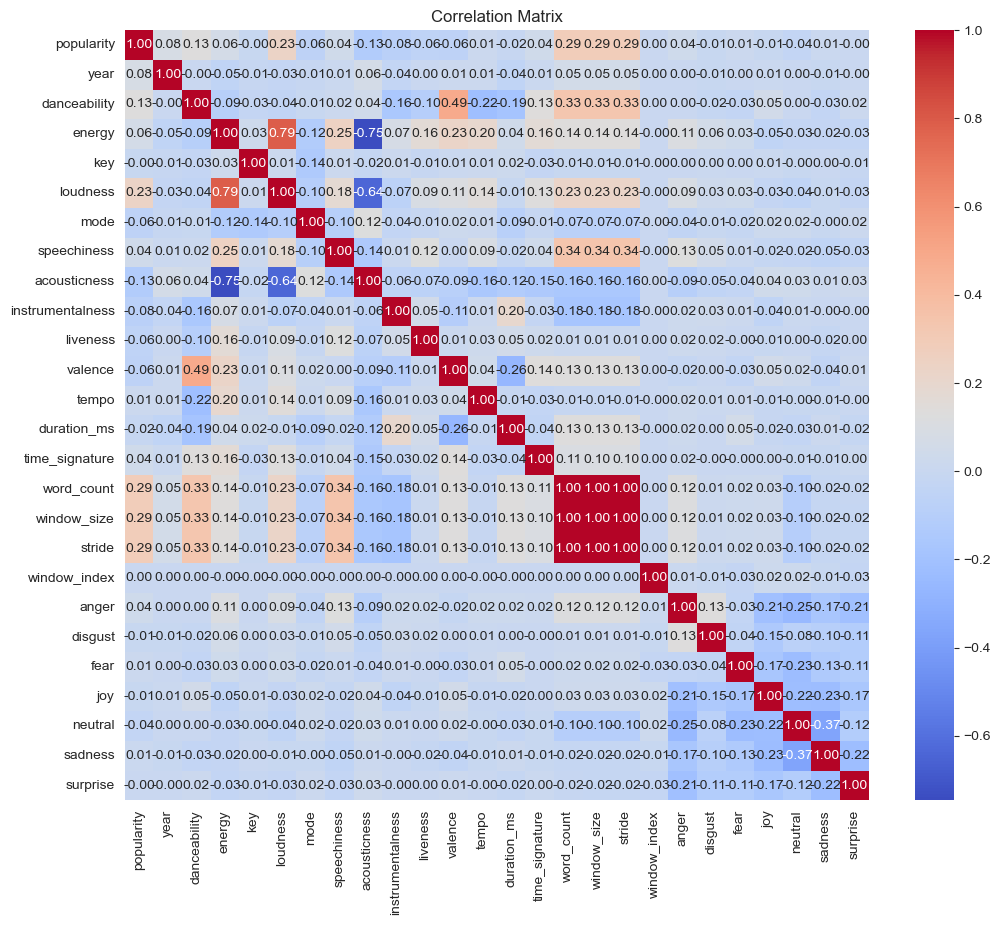

In [23]:
# Select only numeric columns for the correlation calculation
numeric_df = train_df.select_dtypes(include='number')

# Calculate the correlation matrix
correlation = numeric_df.corr()

# Set the figure size larger for readability
plt.figure(figsize=(12, 10))  # Adjust the width and height as needed

# Plot the heatmap
sns.heatmap(correlation, annot=True, cmap='coolwarm', fmt=".2f")

plt.title('Correlation Matrix')
plt.show()

In [ ]:
# Plot sentiment trends for each song
for song in train_df['song_artist'].unique()[:5]:  # Analyze first 5 songs
    song_data = train_df[train_df['song_artist'] == song]
    plt.figure(figsize=(10, 4))
    for col in sentiment_columns:
        plt.plot(song_data['window_index'], song_data[col], label=col)
    plt.title(f'Sentiment Trends in "{song}"')
    plt.xlabel('Window Index')
    plt.ylabel('Sentiment Score')
    plt.legend()
    plt.show()

In [25]:
# Group by 'song_clean' and count the number of occurrences for each song
song_counts = train_df.groupby('song_artist').size()

# Filter for songs that appear more than 20 times (which would indicate duplicates)
duplicate_songs = song_counts[song_counts > 20]

# Display the songs with more than 20 occurrences
print(duplicate_songs)

Series([], dtype: int64)


In [ ]:
# COMPARE MODEL TO VERSION WHERE WE TAKE ALL DATAPOINTS, DISREGARD ORDER

In [27]:
# Group by genre and window index, and compute the mean sentiment score for each window
grouped_sentiment = train_df.groupby(['genre', 'window_index'])[sentiment_columns].mean().reset_index()

# Display the grouped data
grouped_sentiment

,genre,window_index,anger,disgust,fear,joy,neutral,sadness,surprise
0,acoustic,0,0.091035,0.041061,0.089357,0.189483,0.252142,0.165661,0.171261
1,acoustic,1,0.105793,0.025040,0.047448,0.183547,0.281826,0.169364,0.186983
2,acoustic,2,0.092246,0.026764,0.084006,0.142907,0.291779,0.183366,0.178932
3,acoustic,3,0.085861,0.025084,0.056714,0.106415,0.375582,0.202368,0.147976
4,acoustic,4,0.096384,0.019651,0.091897,0.141908,0.358866,0.125150,0.166144
...,...,...,...,...,...,...,...,...,...
1015,trip-hop,15,0.105511,0.016023,0.116005,0.095534,0.265825,0.232483,0.168619
1016,trip-hop,16,0.064992,0.020252,0.029115,0.185951,0.323745,0.169810,0.206135
1017,trip-hop,17,0.068883,0.062213,0.062467,0.129169,0.416876,0.123448,0.136945
1018,trip-hop,18,0.126894,0.047514,0.047164,0.063631,0.390866,0.185595,0.138337


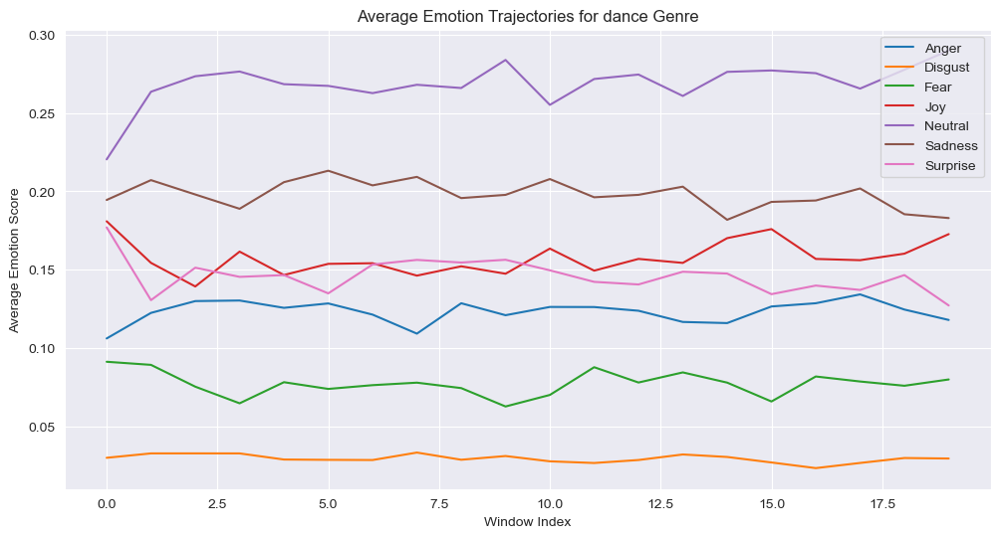

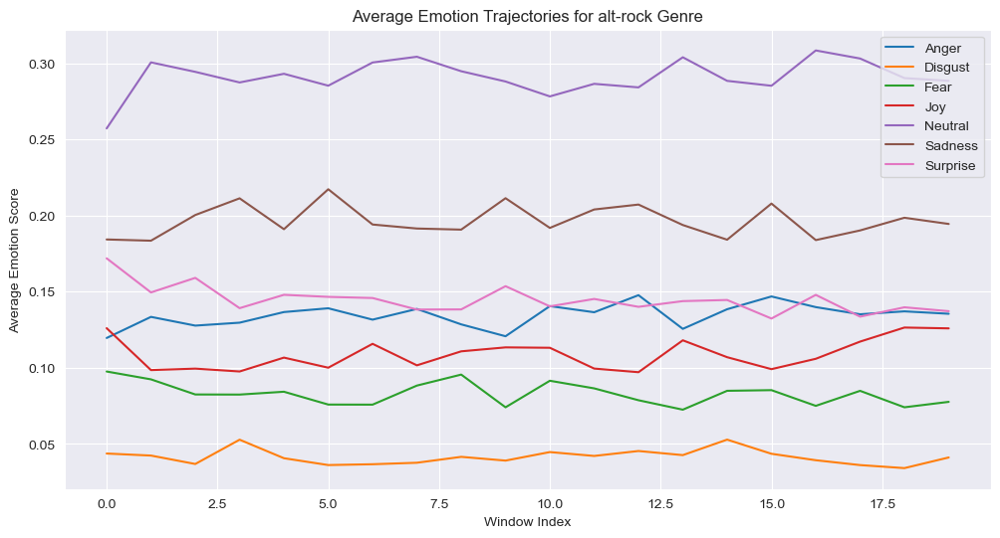

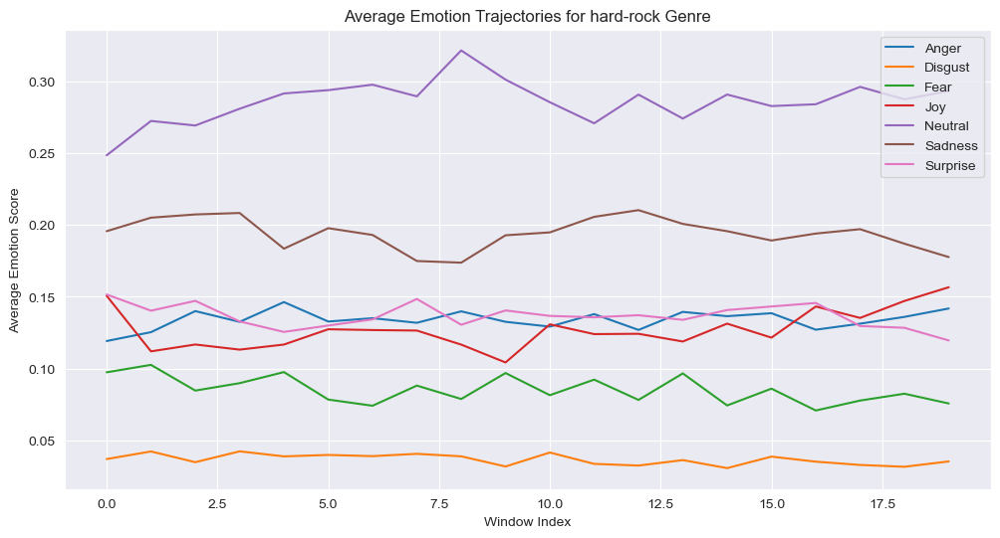

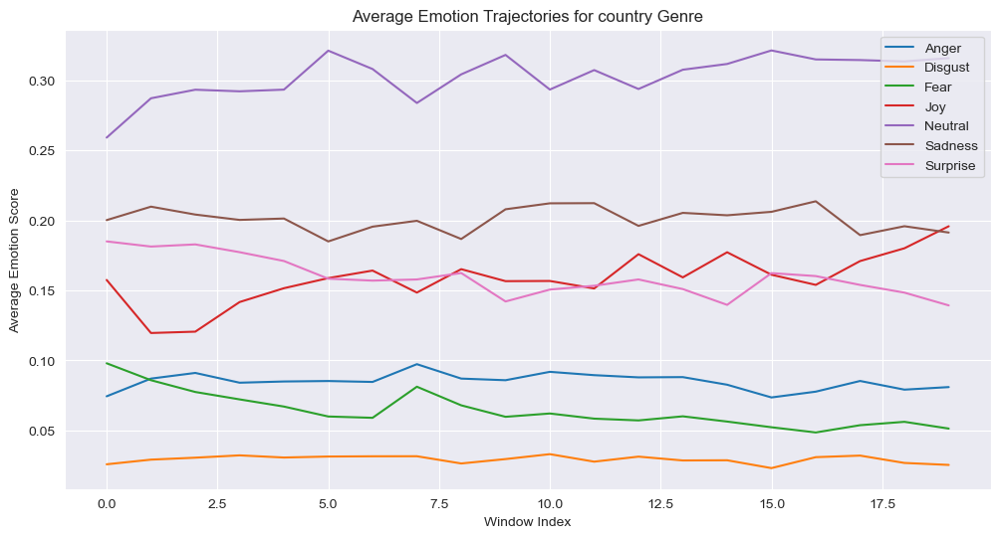

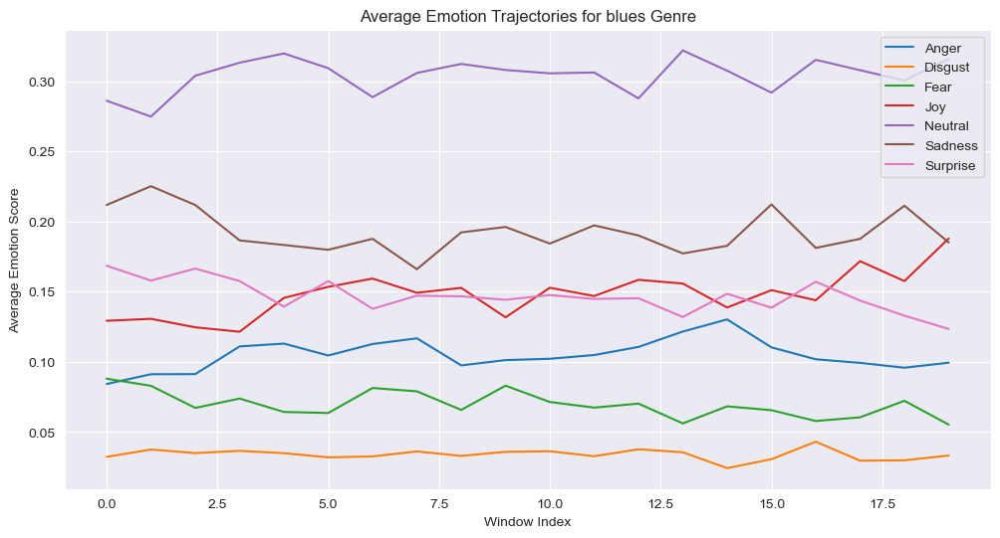

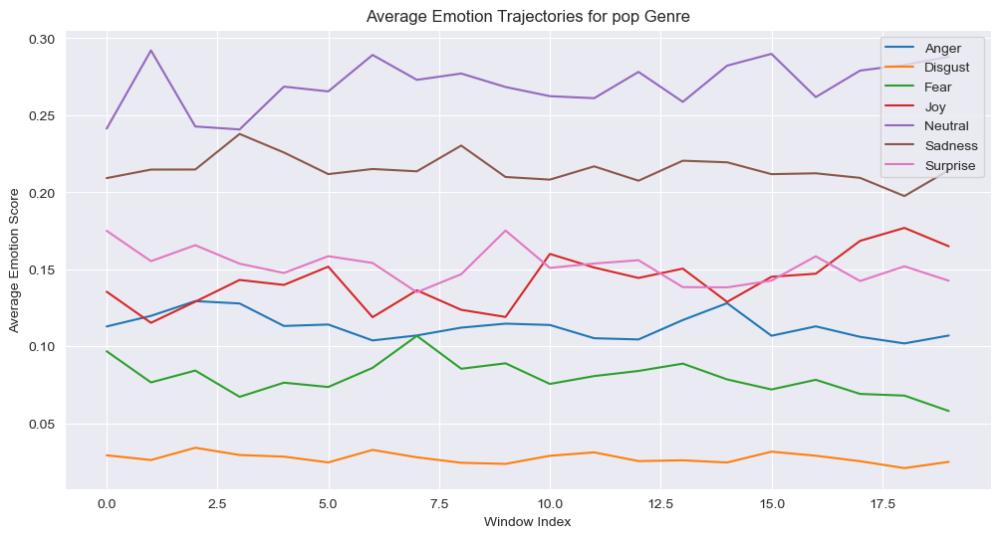

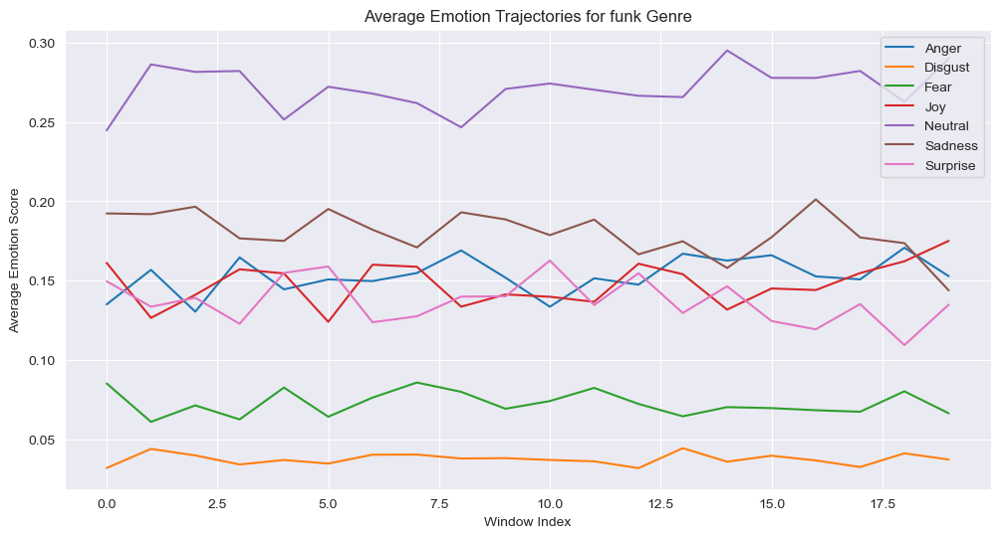

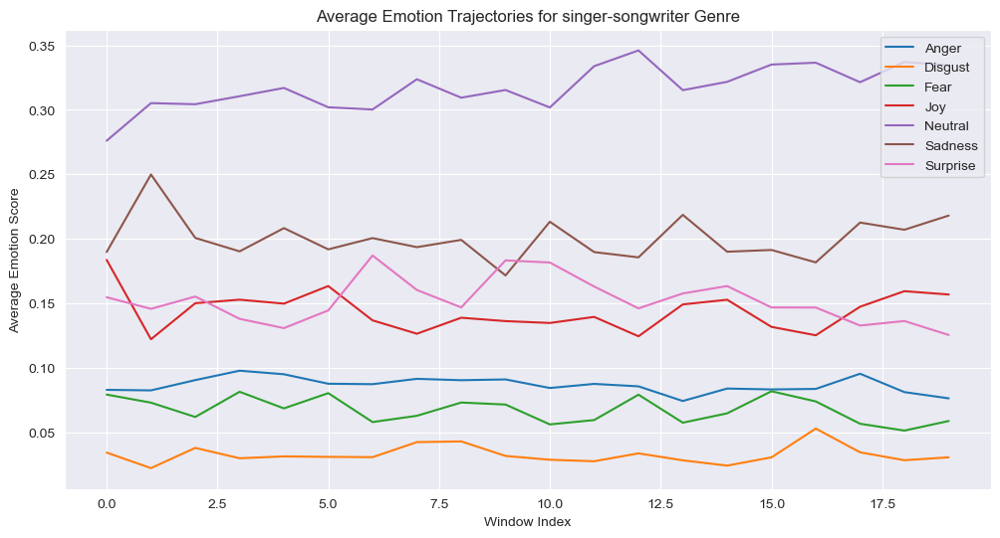

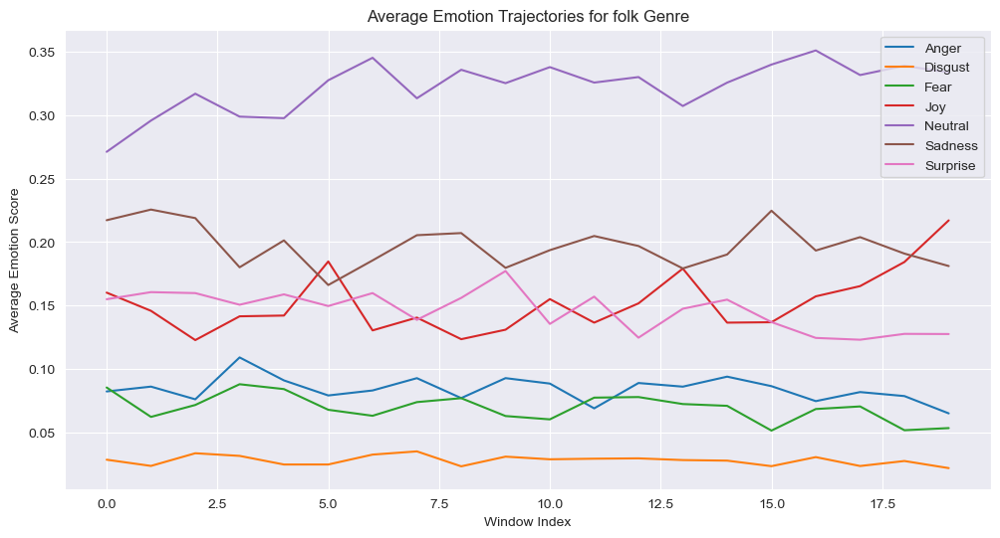

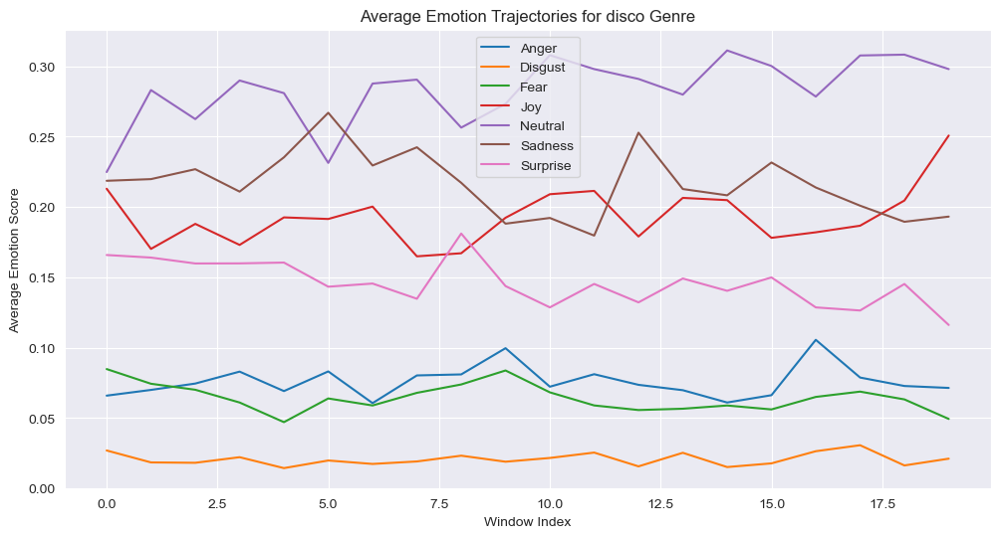

In [56]:
# Top 10 Genres by occurrence
top_genres = train_df['genre'].value_counts().nlargest(10).index

def plot_average_emotion_trajectories(df):
    for genre in top_genres:
        genre_df = df[df['genre'] == genre]
        averaged = genre_df.groupby('window_index')[sentiment_columns].mean()
        
        plt.figure(figsize=(12, 6))
        for emotion in sentiment_columns:
            plt.plot(averaged.index, averaged[emotion], label=emotion.capitalize())
        
        plt.title(f'Average Emotion Trajectories for {genre} Genre')
        plt.xlabel('Window Index')
        plt.ylabel('Average Emotion Score')
        plt.legend()
        plt.show()

plot_average_emotion_trajectories(train_df)

In [29]:
def compute_genre_similarity(df):
    similarity_matrix = pd.DataFrame(index=top_genres, columns=top_genres, dtype=float)
    
    for i, genre1 in enumerate(top_genres):
        for j, genre2 in enumerate(top_genres):
            if i <= j:
                similarities = []
                for emotion in sentiment_columns:
                    traj1 = df[df['genre'] == genre1].groupby('window_index')[emotion].mean()
                    traj2 = df[df['genre'] == genre2].groupby('window_index')[emotion].mean()
                    corr, _ = pearsonr(traj1, traj2)
                    similarities.append(corr)
                average_similarity = sum(similarities) / len(similarities)
                similarity_matrix.loc[genre1, genre2] = average_similarity
                similarity_matrix.loc[genre2, genre1] = average_similarity
    
    return similarity_matrix

# Example usage:
similarity_matrix = compute_genre_similarity(df)
print(similarity_matrix)

genre                 dance  alt-rock  hard-rock   country     blues  \
genre                                                                  
dance              1.000000  0.442543   0.377225  0.321450  0.125604   
alt-rock           0.442543  1.000000   0.374731  0.292138  0.281360   
hard-rock          0.377225  0.374731   1.000000  0.416373  0.420262   
country            0.321450  0.292138   0.416373  1.000000  0.459069   
blues              0.125604  0.281360   0.420262  0.459069  1.000000   
pop                0.256205  0.209126   0.285034  0.301466  0.205097   
funk               0.267294  0.152457   0.172395  0.159993  0.272028   
singer-songwriter  0.261669  0.119683   0.252109  0.183936  0.242094   
folk               0.343688  0.219352   0.267916  0.377850  0.379516   
disco              0.318057  0.329757   0.277878  0.327478  0.217217   

genre                   pop      funk  singer-songwriter      folk     disco  
genre                                                   

In [57]:
# We will now perform DTW analysis
def prepare_time_series(genre_df, sentiment_cols, n_windows=20):
    """
    Prepares a 3D numpy array for multivariate DTW.
    """
    genre_df_sorted = genre_df.sort_values(['song_artist', 'window_index'])
    grouped = genre_df_sorted.groupby('song_artist')
    complete_songs = grouped.filter(lambda x: len(x) == n_windows)['song_artist'].unique()
    time_series_list = []
    valid_songs = []
    for song in complete_songs:
        song_data = genre_df_sorted[genre_df_sorted['song_artist'] == song].sort_values('window_index')
        emotions = song_data[sentiment_cols].values  # Shape: (n_windows, n_emotions)
        time_series_list.append(emotions)
        valid_songs.append(song)
    time_series_array = np.array(time_series_list)  # Shape: (n_songs, n_windows, n_emotions)
    return time_series_array, valid_songs


Preparing tuning data for genre: dance
Preparing tuning data for genre: alt-rock
Preparing tuning data for genre: hard-rock
Preparing tuning data for genre: country
Preparing tuning data for genre: blues
Preparing tuning data for genre: pop
Preparing tuning data for genre: funk
Preparing tuning data for genre: singer-songwriter
Preparing tuning data for genre: folk
Preparing tuning data for genre: disco


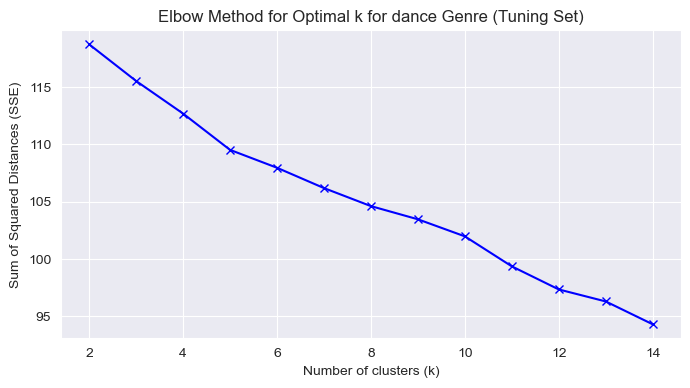

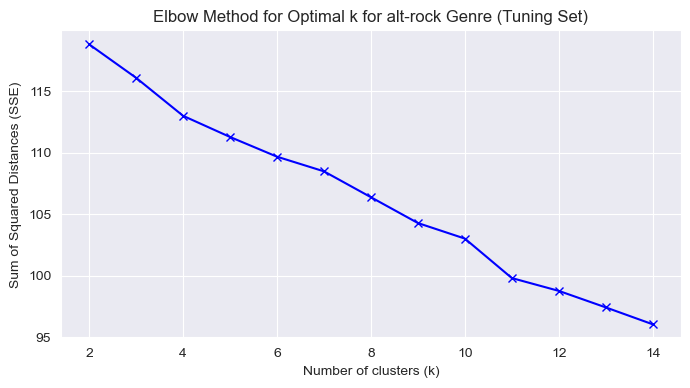

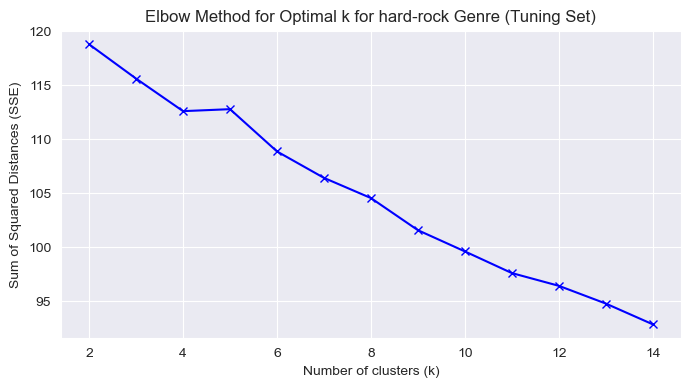

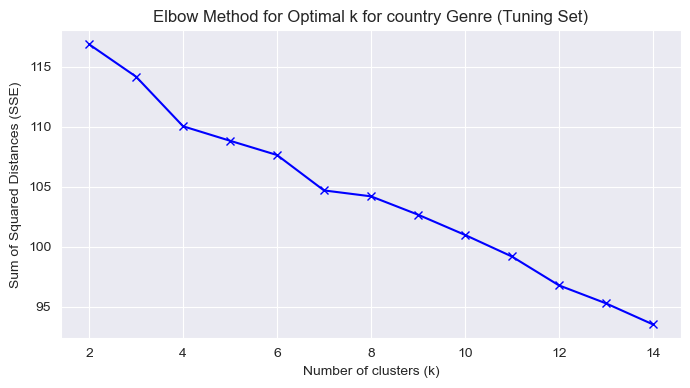

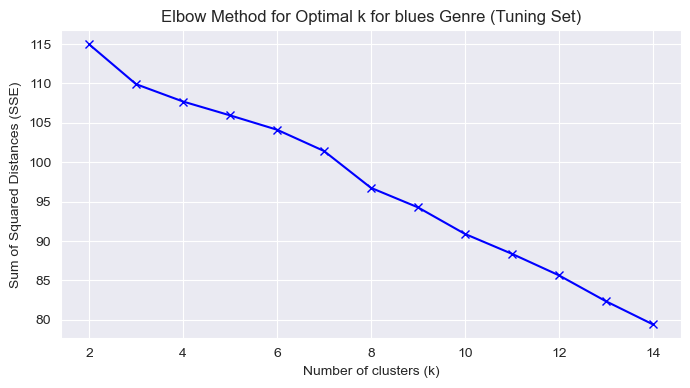

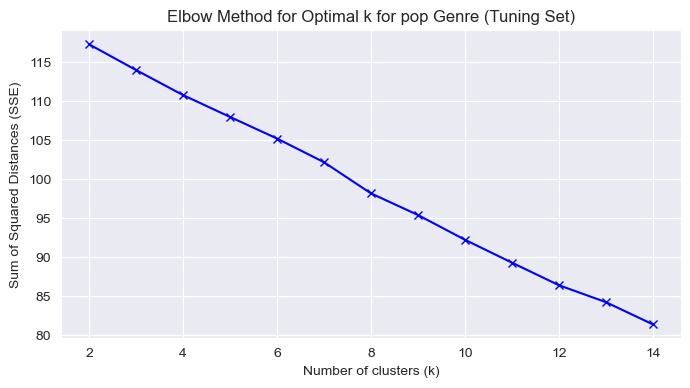

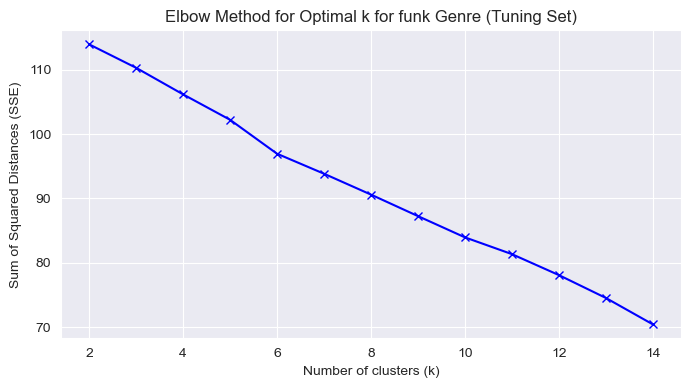

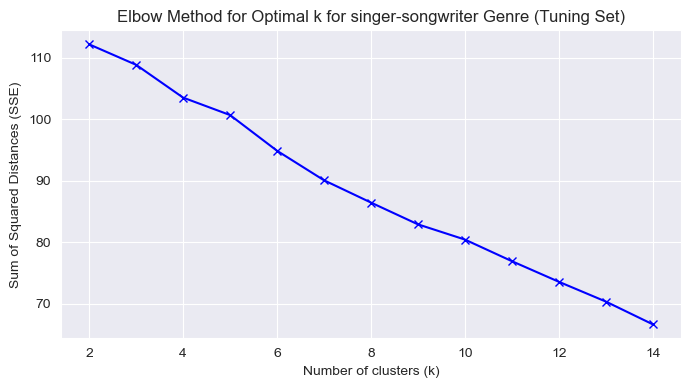

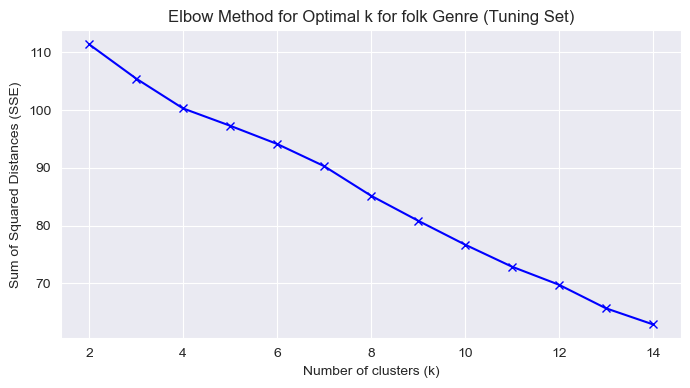

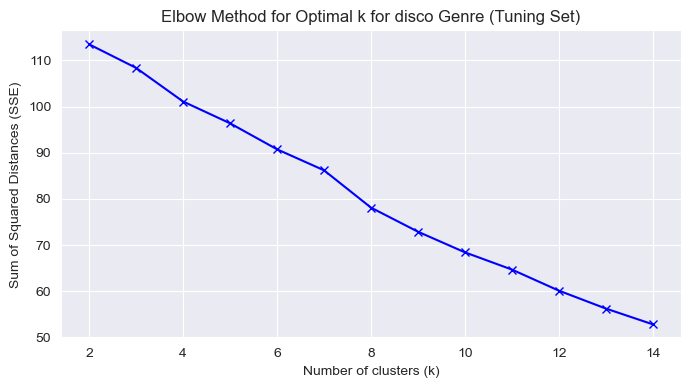

In [58]:
# Assume you have a 'tune_df' similar to 'train_df'

# Step 1: Prepare the time series for the tuning portion (similar to how you did for the training data)
genre_time_series_tune = {}  # Store time series for the tuning set
for genre in top_genres:
    print(f"Preparing tuning data for genre: {genre}")
    genre_df_tune = tune_df[tune_df['genre'] == genre].copy()
    ts_array_tune, songs_tune = prepare_time_series(genre_df_tune, sentiment_columns, n_windows=20)
    if ts_array_tune.size == 0:
        print(f"No complete songs found for genre: {genre} in tuning set")
        continue
    scaler = TimeSeriesScalerMeanVariance()
    ts_scaled_tune = scaler.fit_transform(ts_array_tune)
    genre_time_series_tune[genre] = ts_scaled_tune

# Step 2: Elbow Method for finding the optimal number of clusters using the tuning set
for genre in top_genres:
    sse = []  # To store sum of squared errors for each number of clusters
    K = range(2, 15)  # Testing cluster numbers from 2 to 15 (you can adjust this range as needed)
    
    time_series_data_tune = genre_time_series_tune[genre]  # Access the time series data for the genre (from tuning set)
    
    # Elbow method using TimeSeriesKMeans with DTW
    for k in K:
        model = TimeSeriesKMeans(n_clusters=k, metric="dtw", max_iter=10, random_state=0, n_jobs=-1)
        model.fit(time_series_data_tune)  # Fit the time series data for this genre (tuning set)
        sse.append(model.inertia_)  # Append the sum of squared distances (SSE) for this k
    
    # Step 3: Plot the Elbow graph to visualize the optimal number of clusters
    plt.figure(figsize=(8, 4))
    plt.plot(K, sse, 'bx-')
    plt.xlabel('Number of clusters (k)')
    plt.ylabel('Sum of Squared Distances (SSE)')
    plt.title(f'Elbow Method for Optimal k for {genre} Genre (Tuning Set)')
    plt.show()


In [65]:
# Now, lets set the optimal k-values based of the tuning set. We should also look into experimenting with hyperparameters for the DTW itself, and visualising the cluster similarities on that data

# Dictionary mapping each genre to its optimal k-value (based on tuning set results)
optimal_k_values = {
    'dance': 5, 
    'alt-rock': 4, 
    'hard-rock': 5, 
    'country': 4, 
    'blues': 3, 
    'pop': 5, 
    'funk': 6,
    'singer-songwriter': 4, 
    'folk': 4, 
    'disco' : 4,
}

Preparing data for genre: dance
Preparing data for genre: alt-rock
Preparing data for genre: hard-rock
Preparing data for genre: country
Preparing data for genre: blues
Preparing data for genre: pop
Preparing data for genre: funk
Preparing data for genre: singer-songwriter
Preparing data for genre: folk
Preparing data for genre: disco
Computing DTW distances for genre: dance
Computing DTW distances for genre: alt-rock
Computing DTW distances for genre: hard-rock
Computing DTW distances for genre: country
Computing DTW distances for genre: blues
Computing DTW distances for genre: pop
Computing DTW distances for genre: funk
Computing DTW distances for genre: singer-songwriter
Computing DTW distances for genre: folk
Computing DTW distances for genre: disco
Clustering songs for genre: dance
Clustering songs for genre: alt-rock
Clustering songs for genre: hard-rock
Clustering songs for genre: country
Clustering songs for genre: blues
Clustering songs for genre: pop
Clustering songs for genr

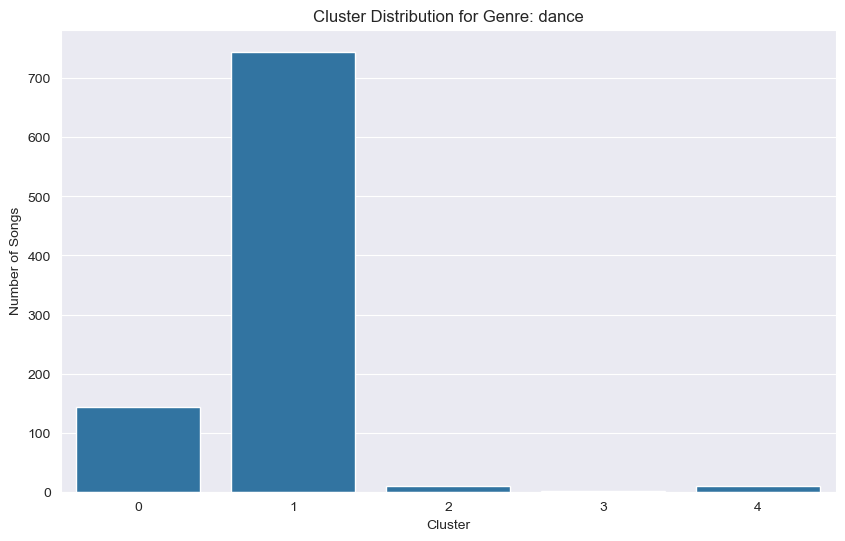

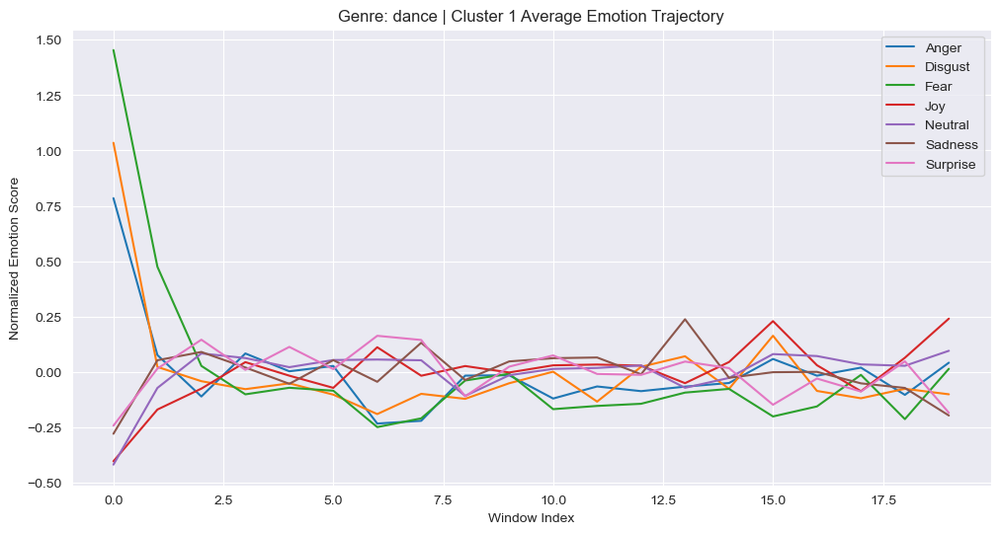

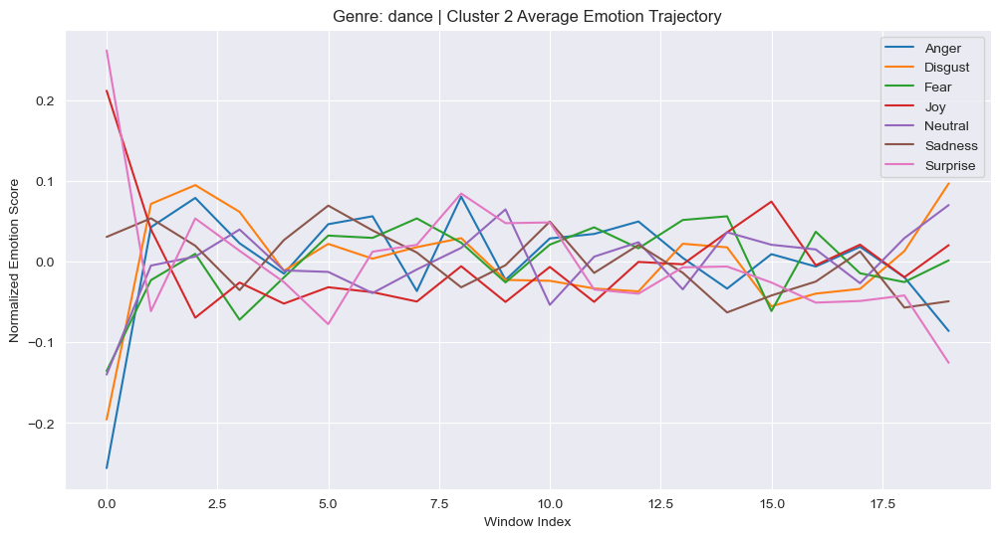

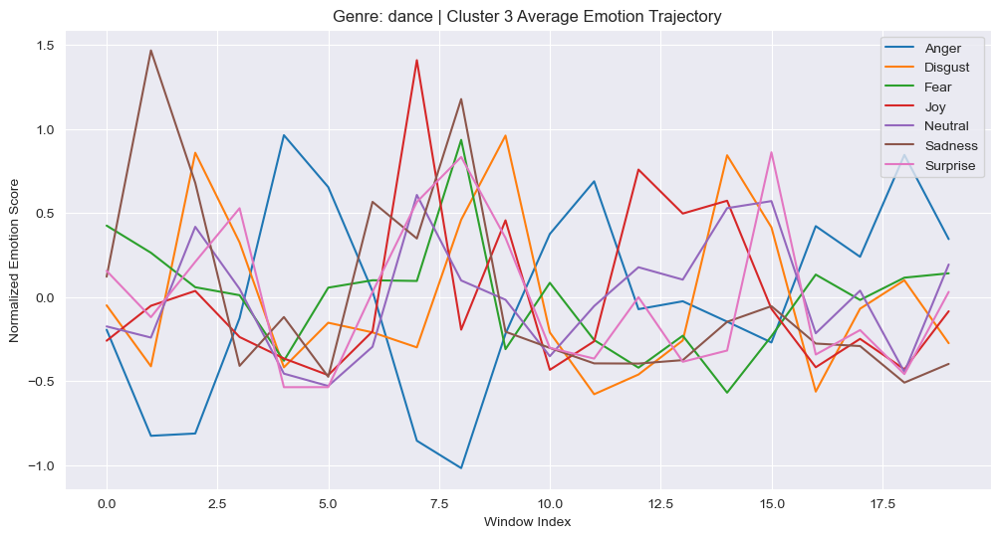

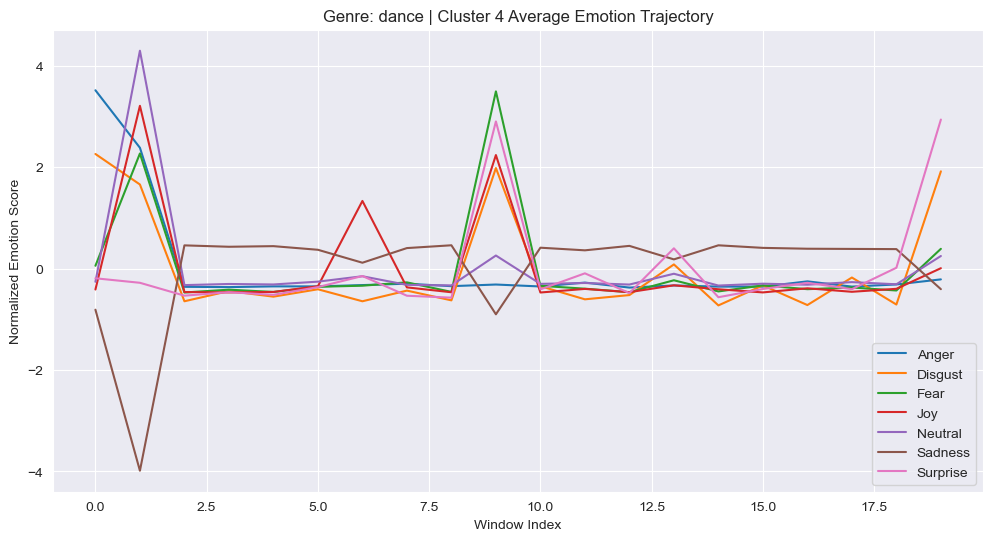

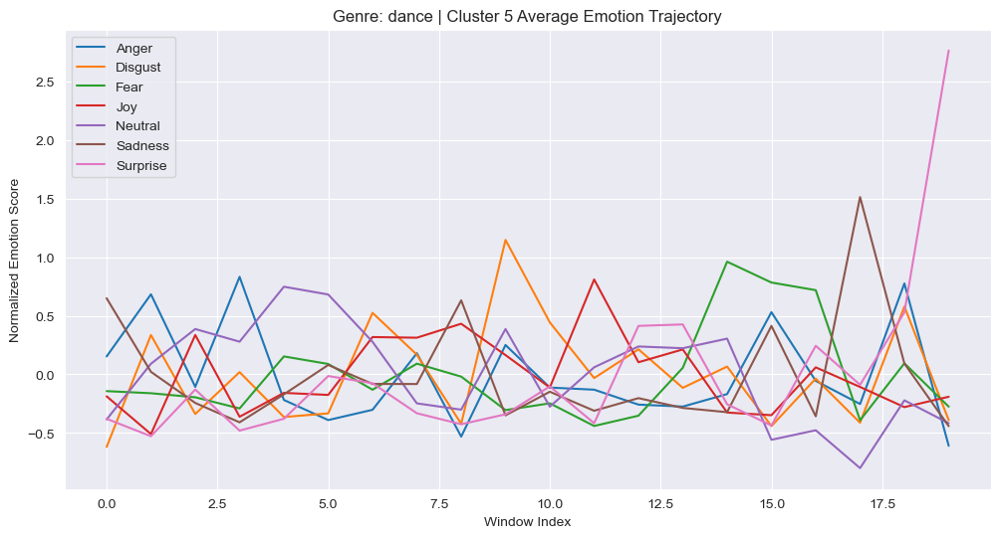

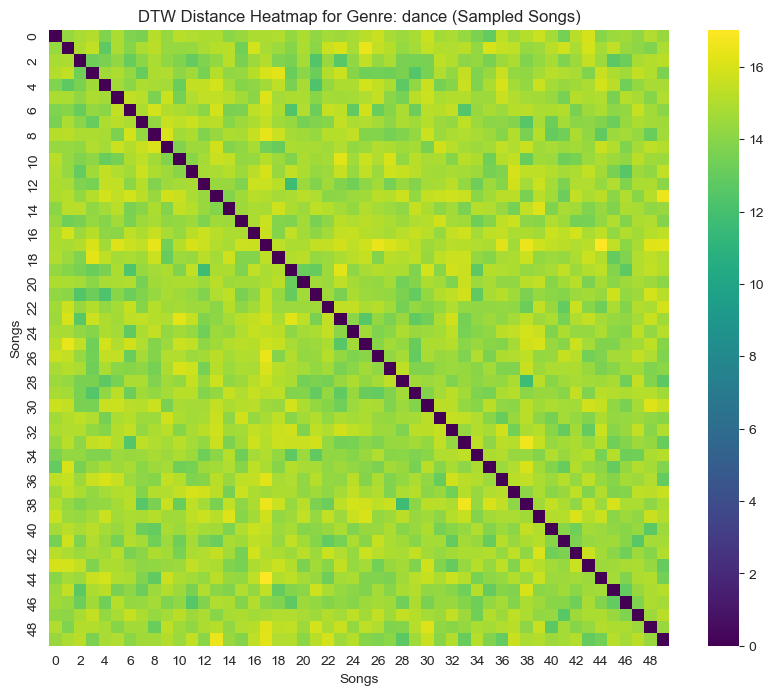

Visualizing clusters for genre: alt-rock


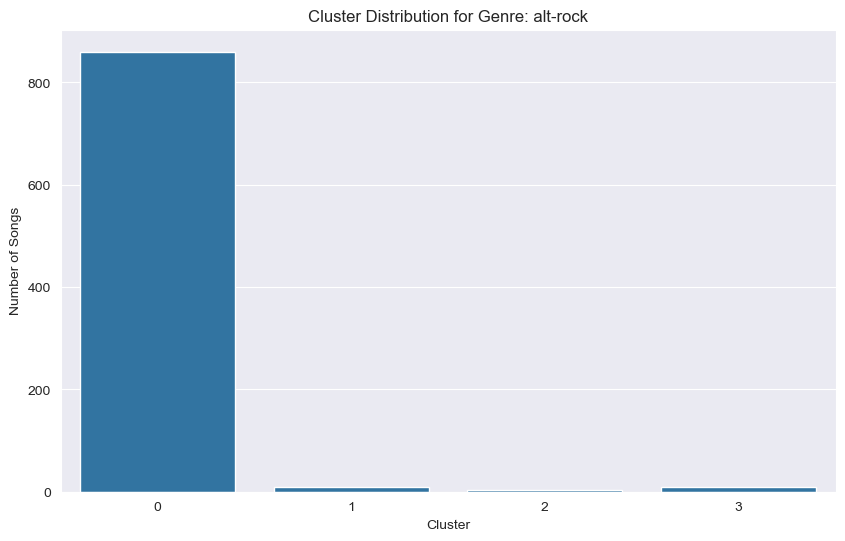

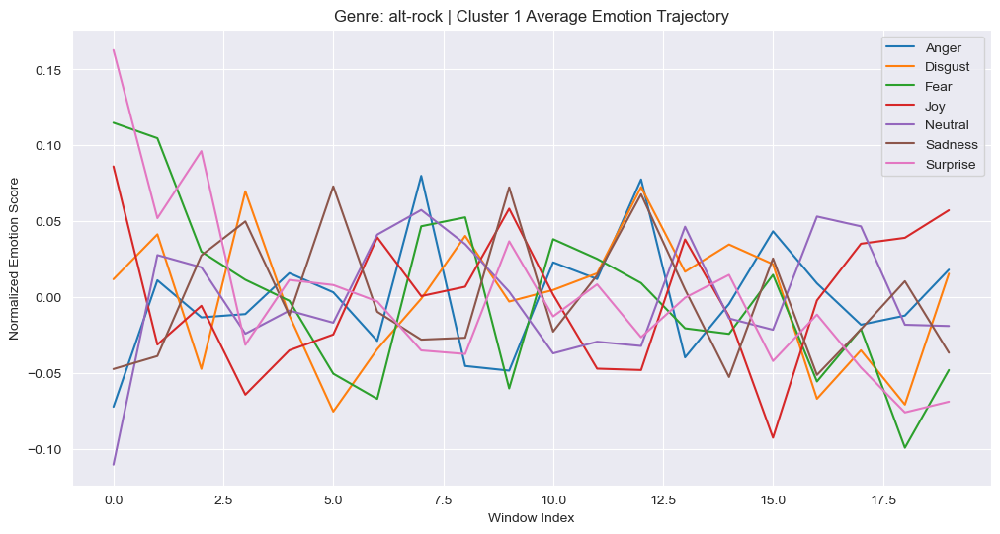

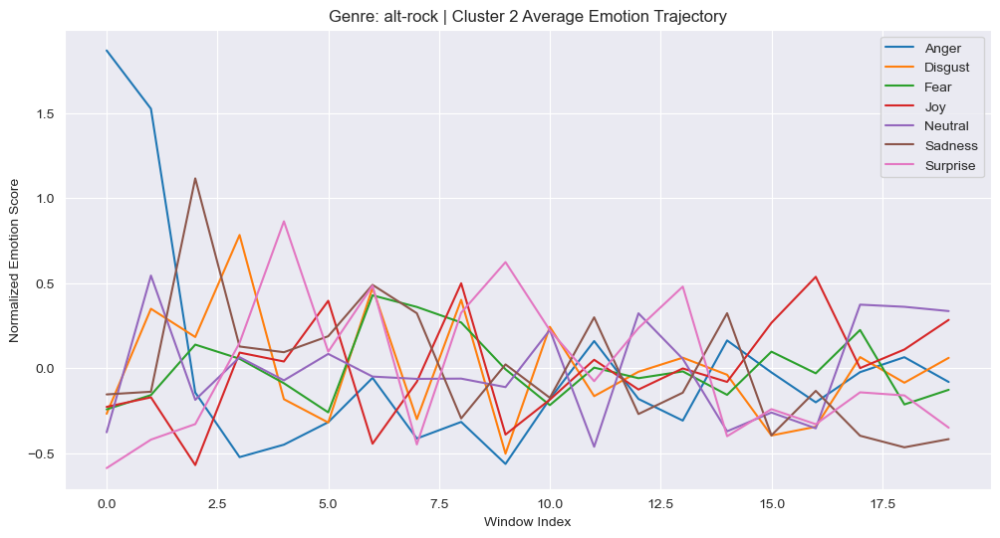

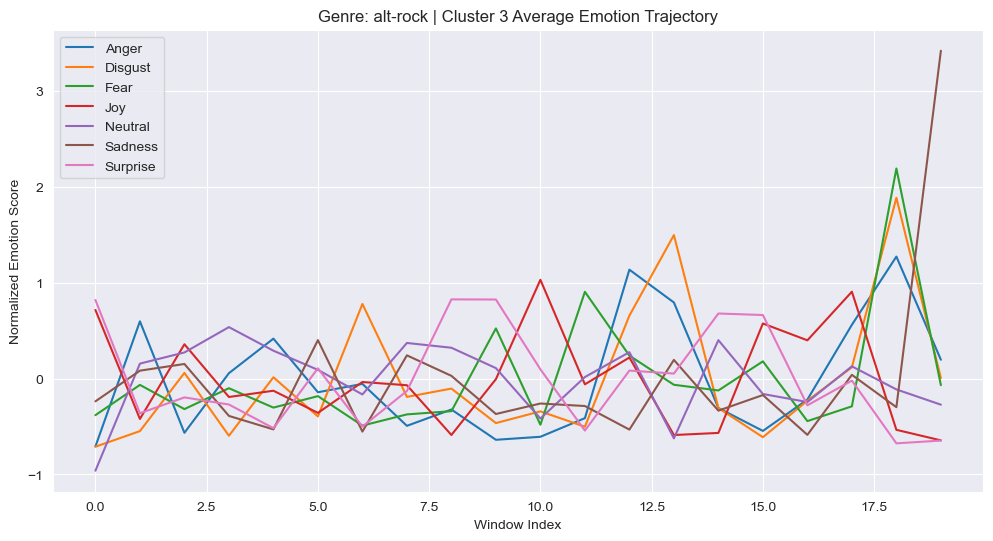

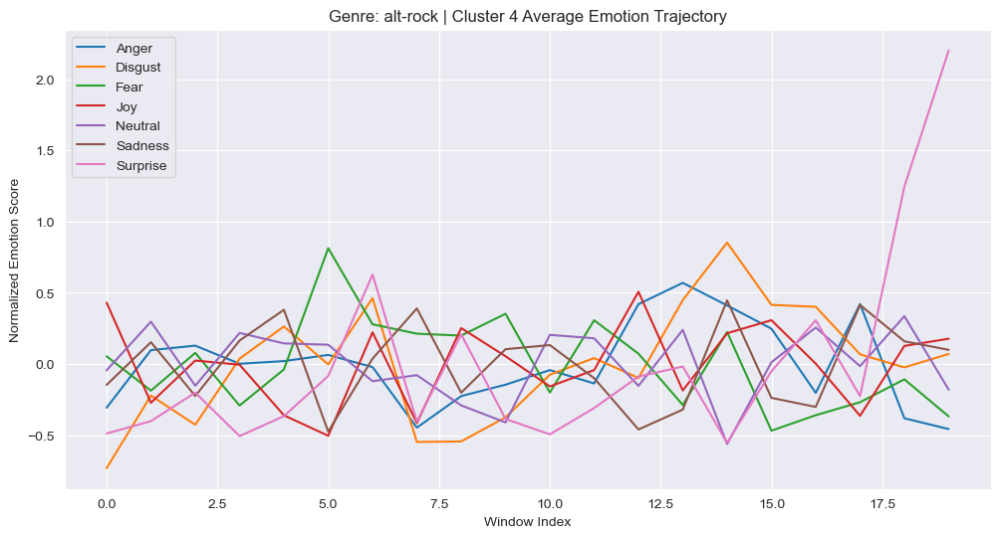

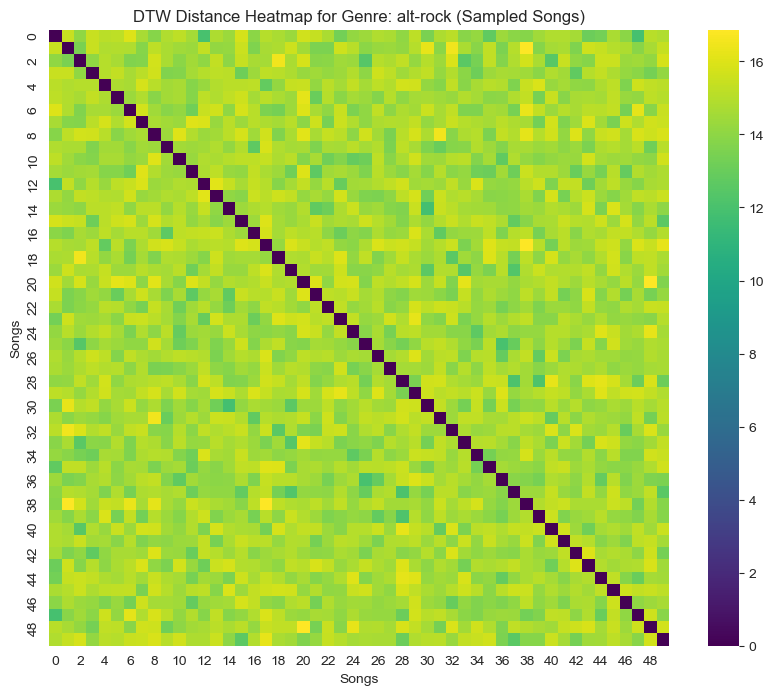

Visualizing clusters for genre: hard-rock


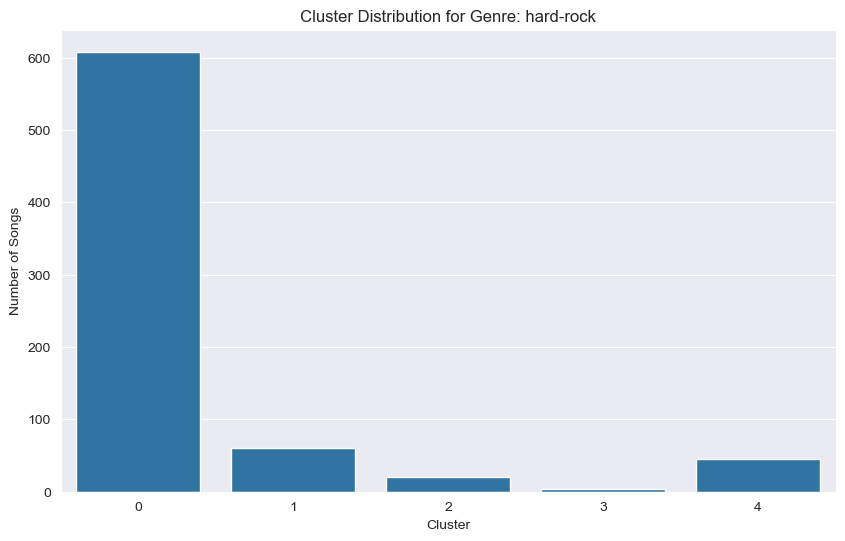

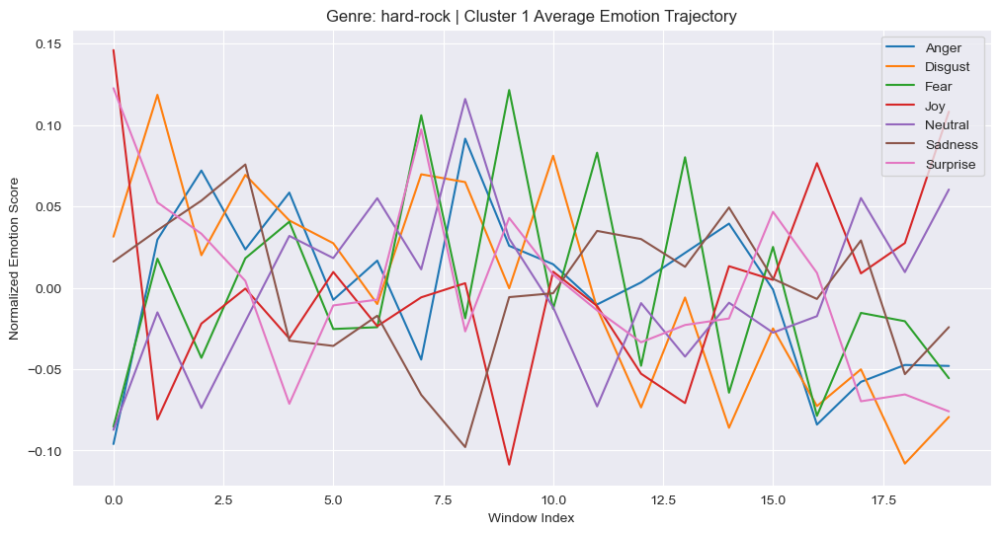

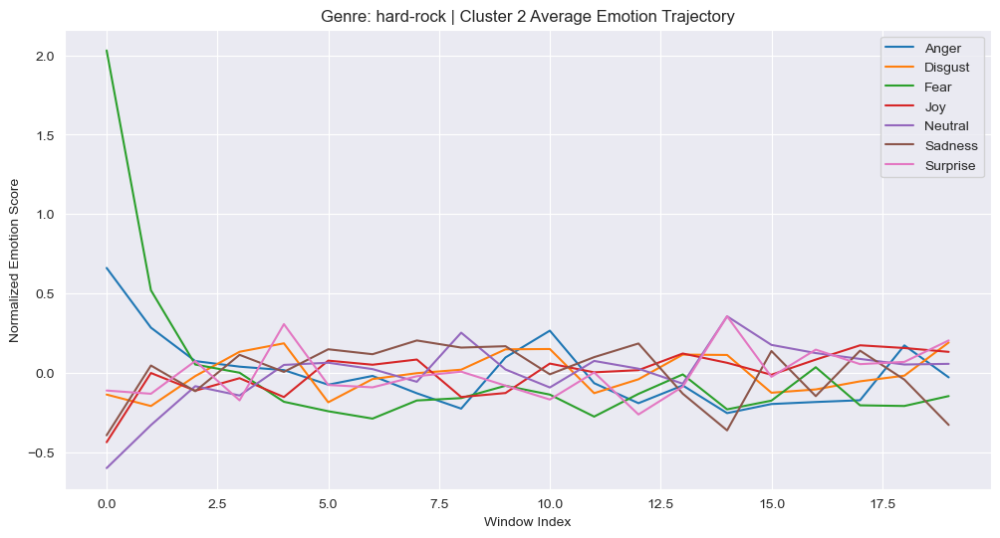

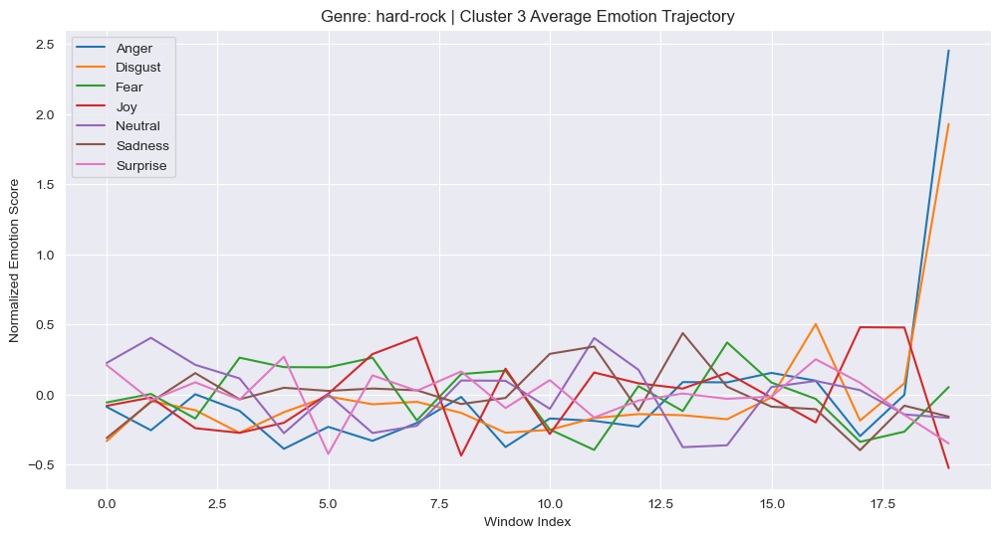

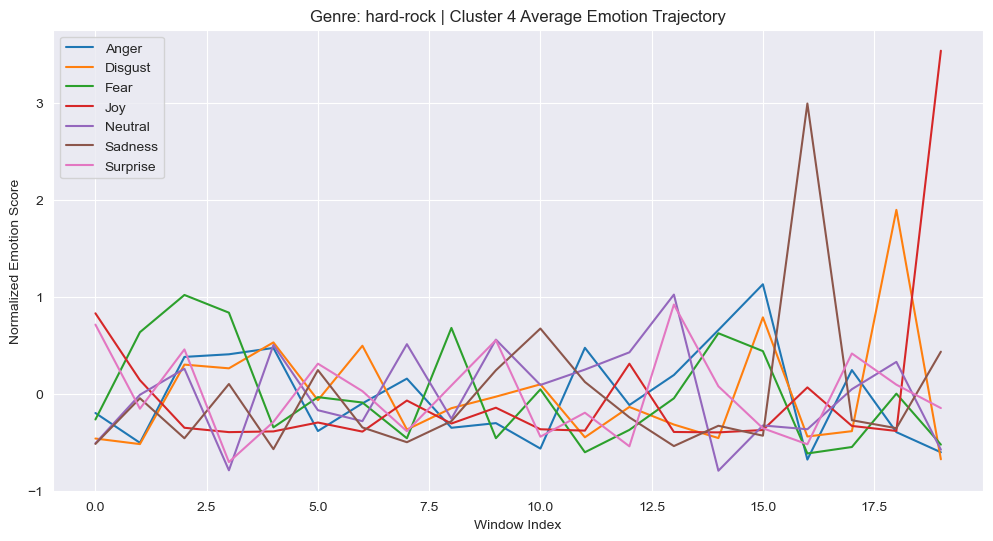

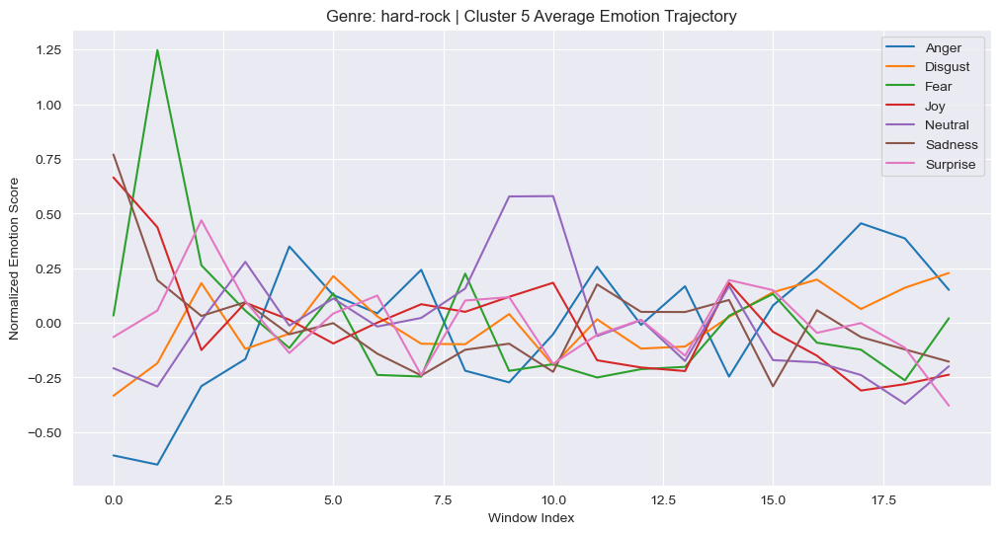

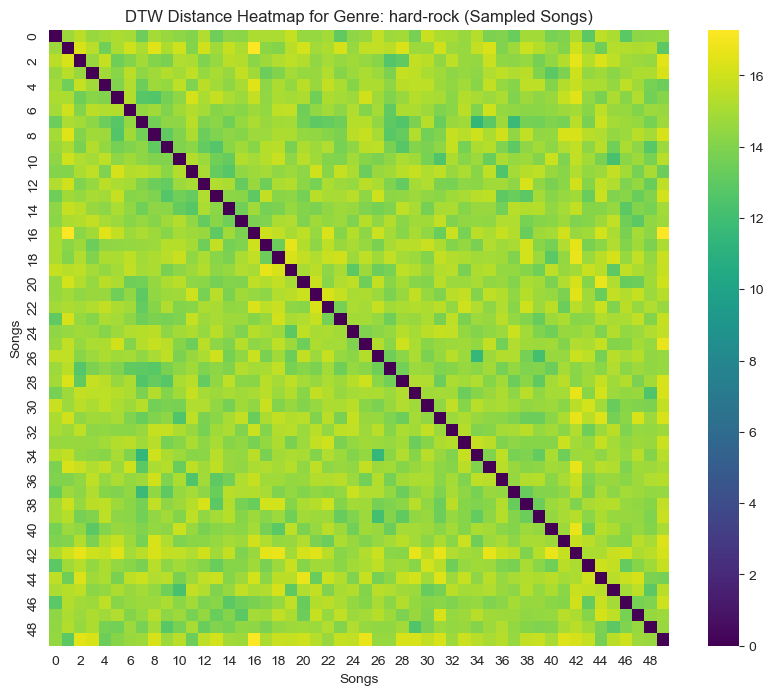

Visualizing clusters for genre: country


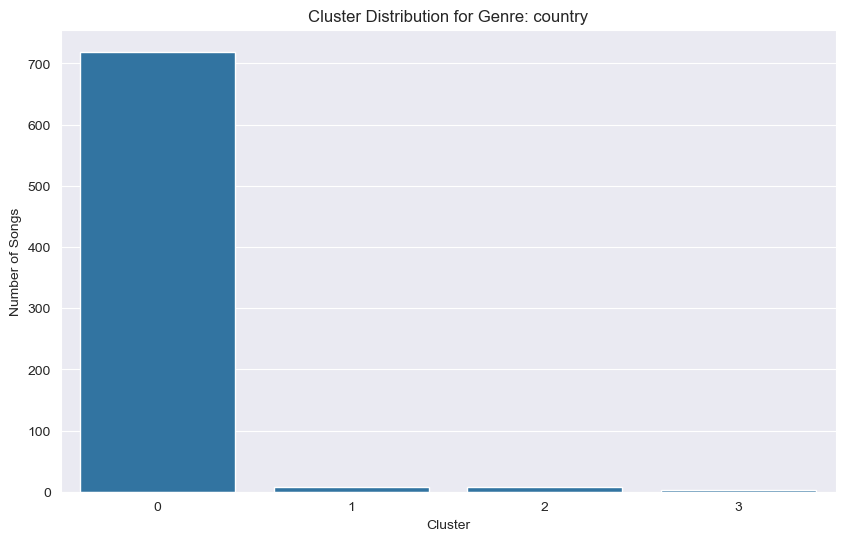

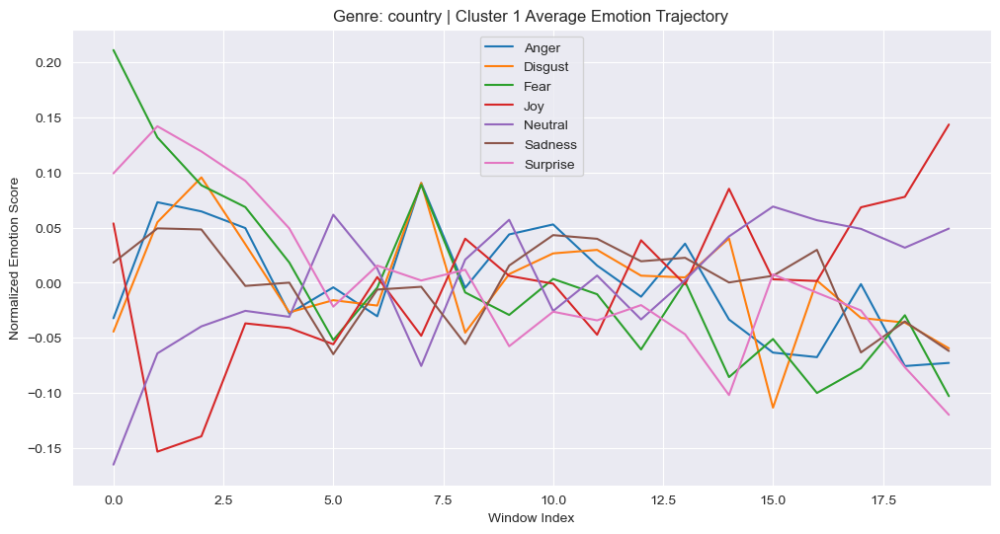

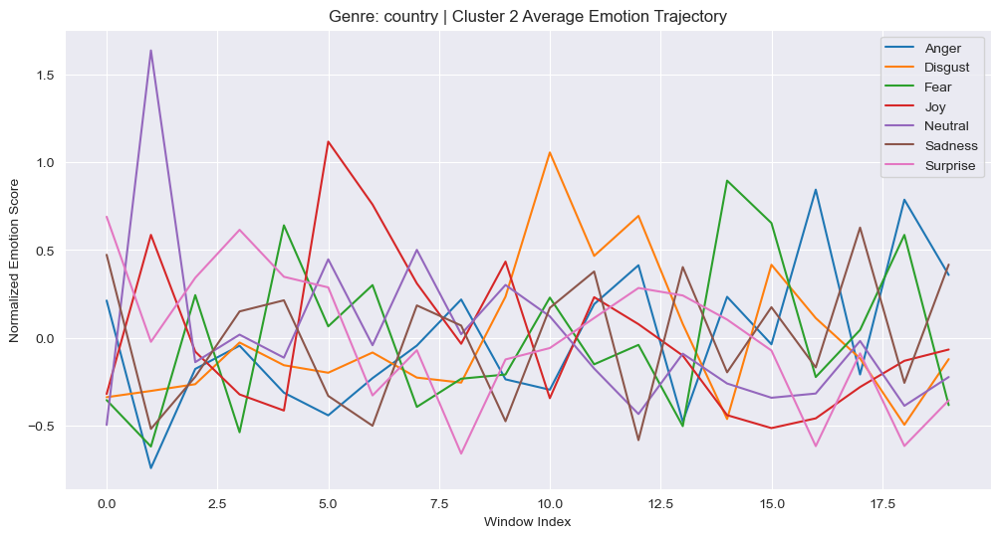

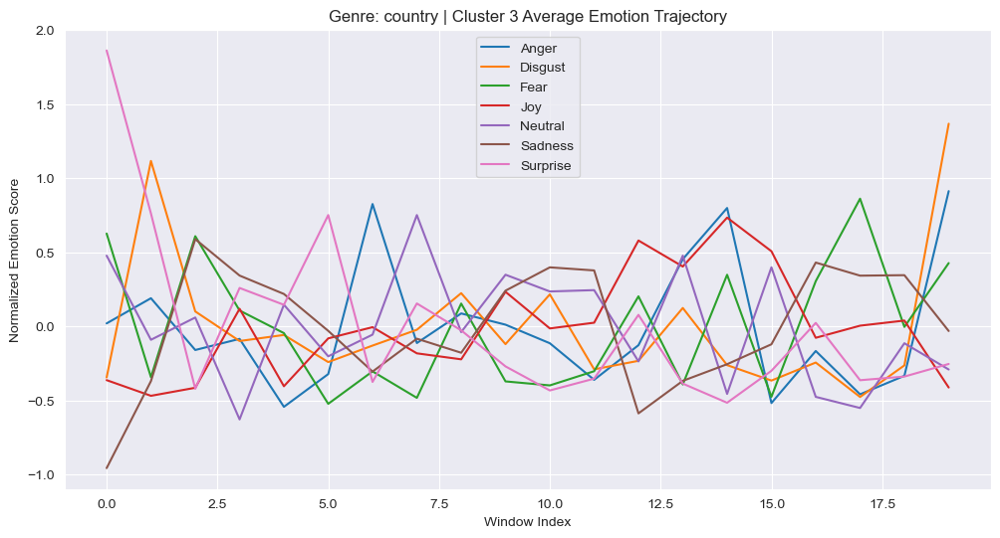

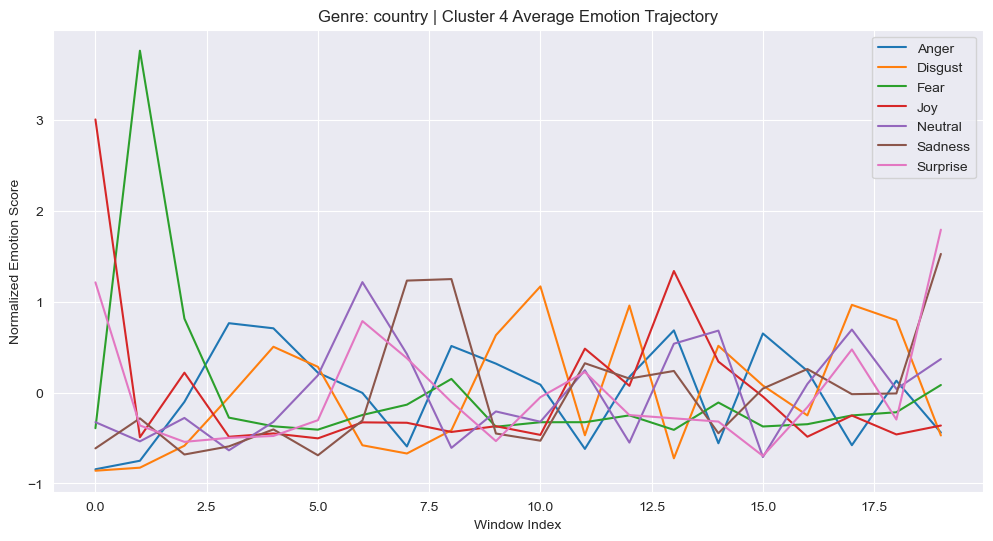

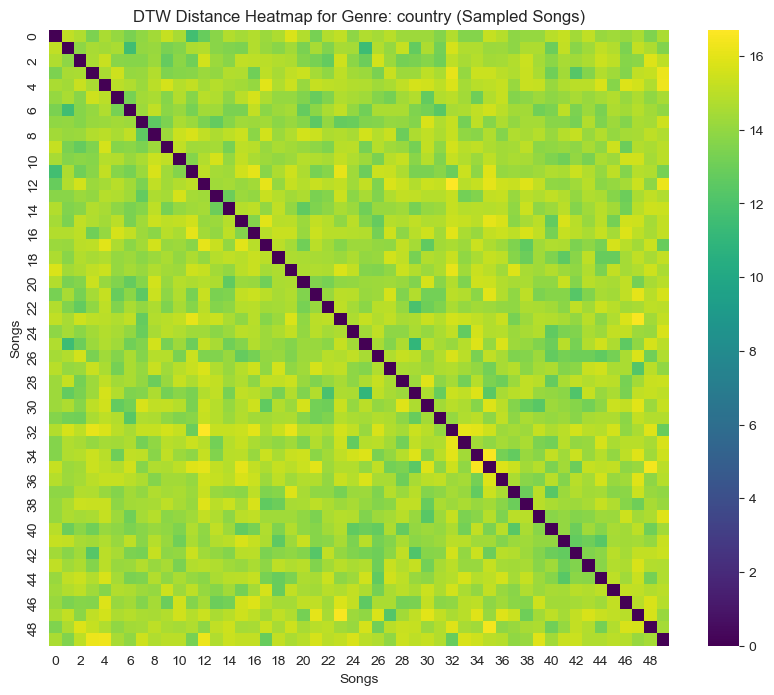

Visualizing clusters for genre: blues


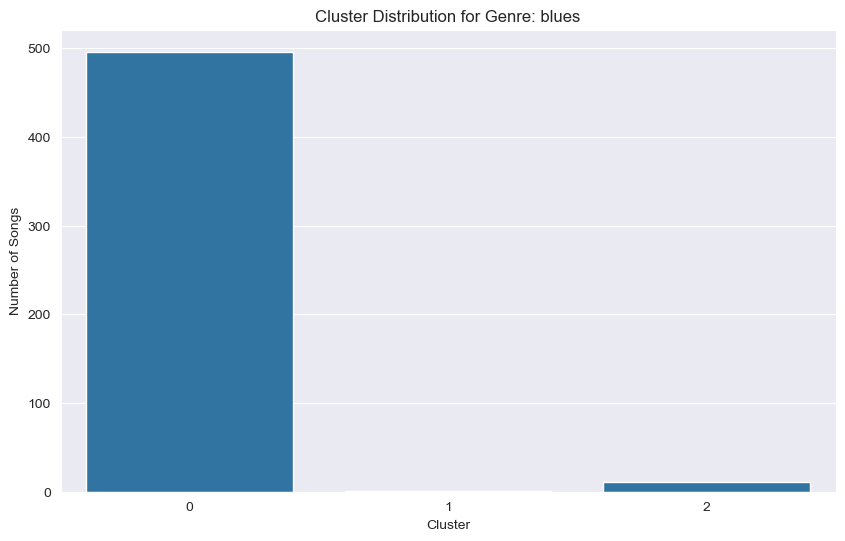

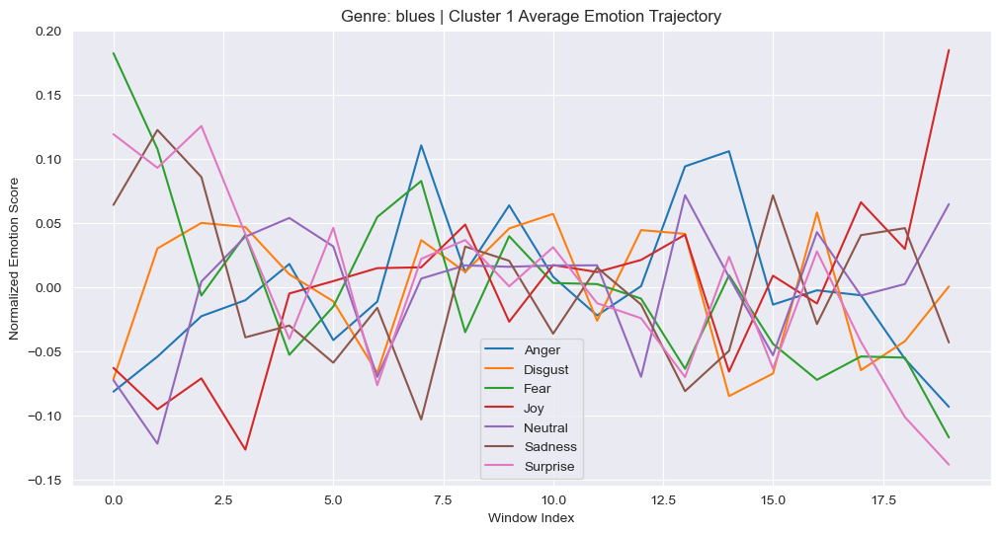

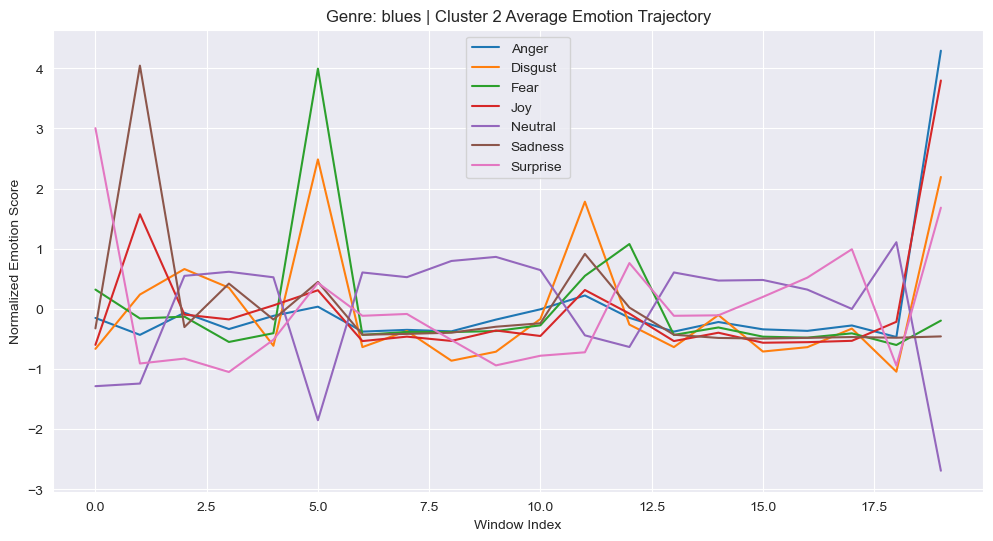

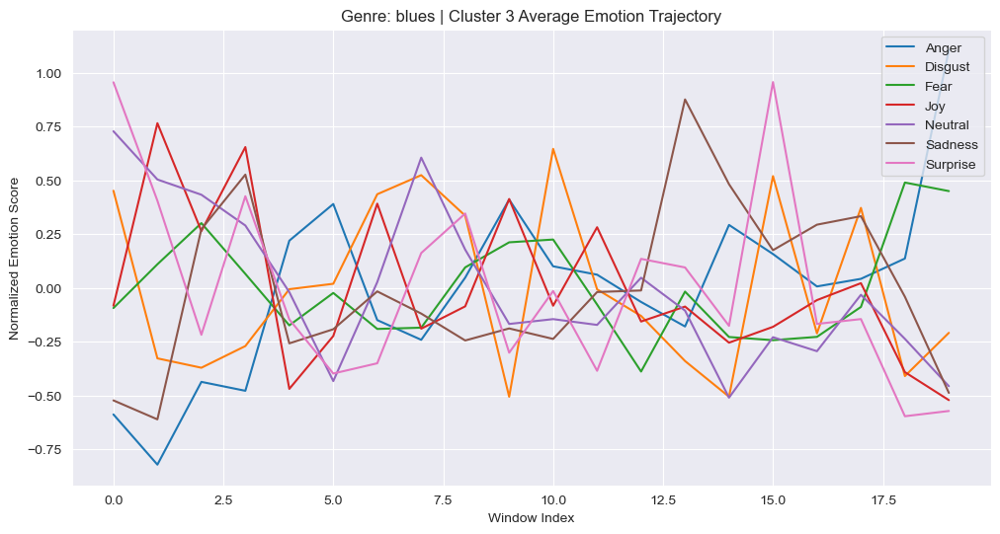

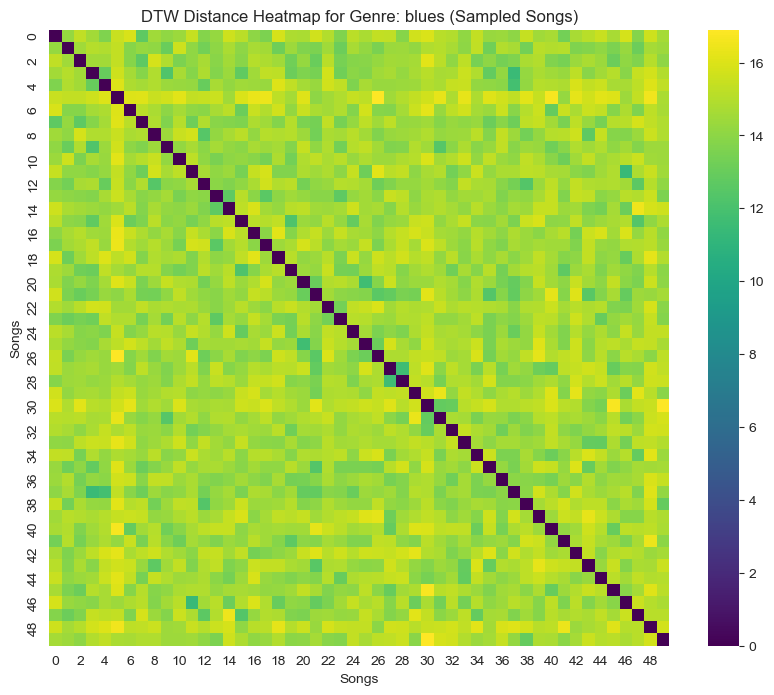

Visualizing clusters for genre: pop


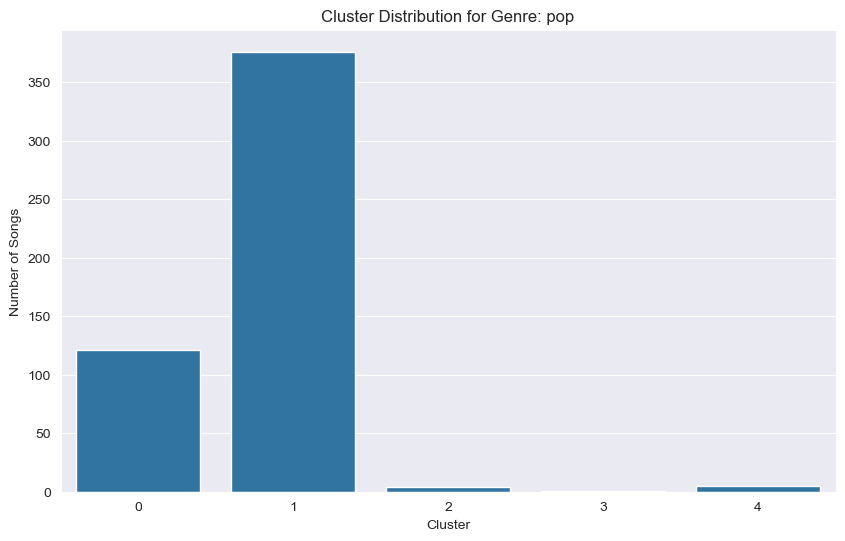

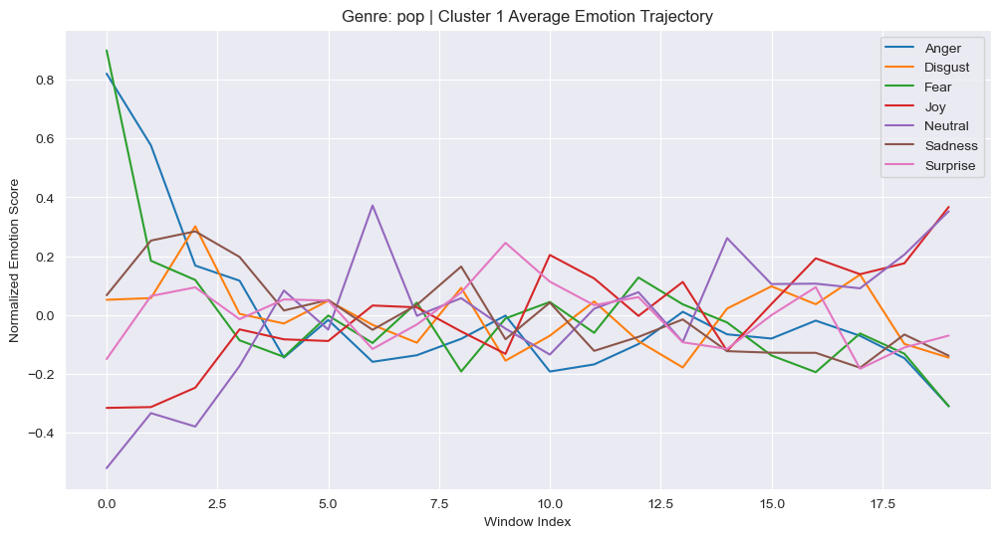

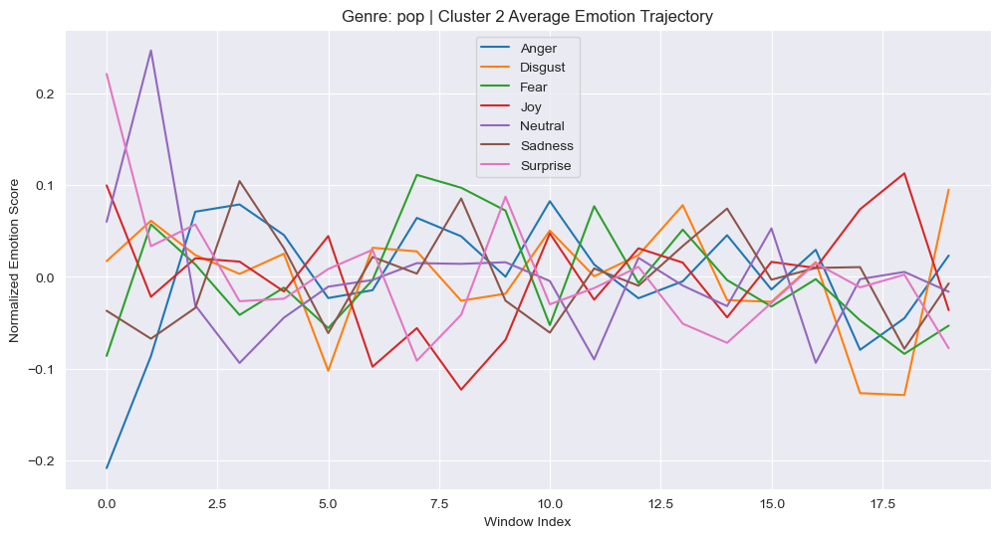

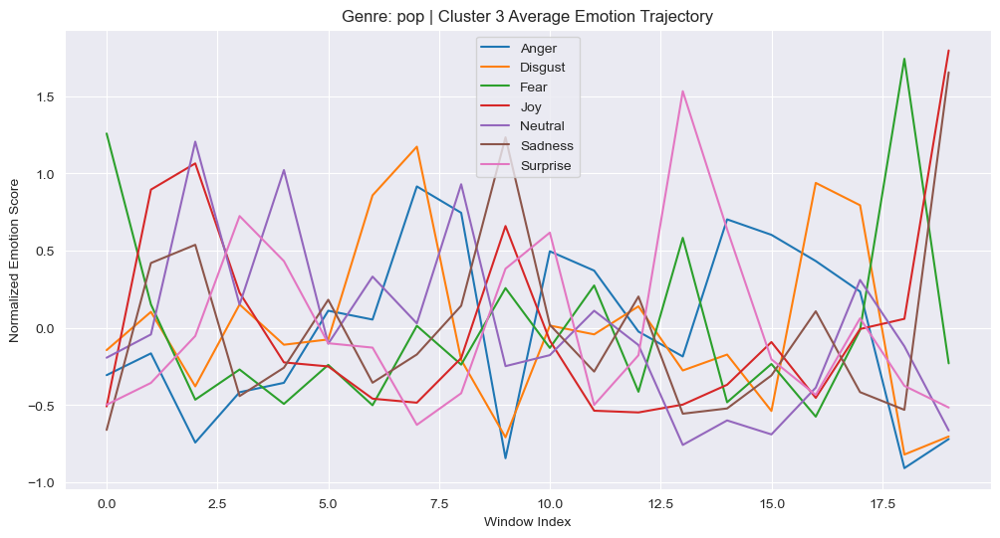

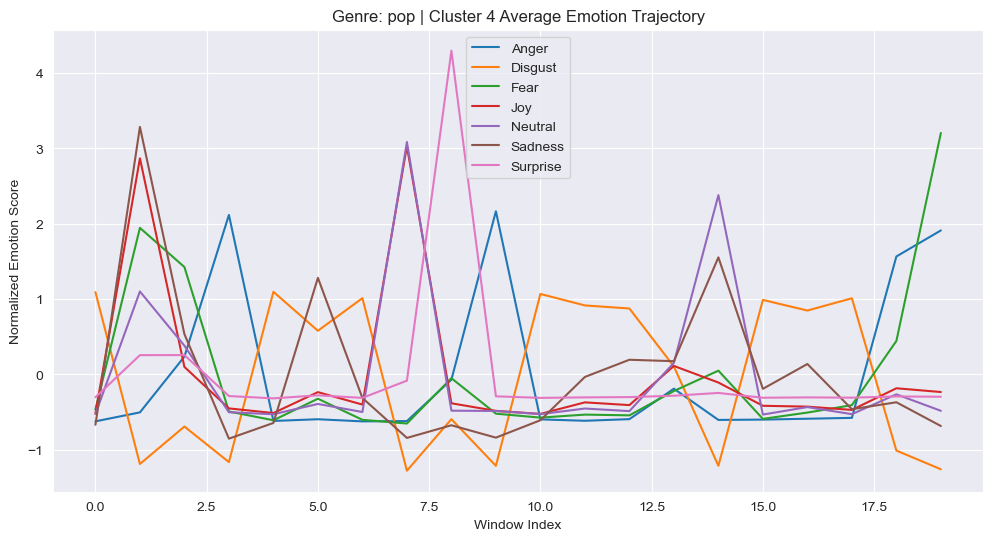

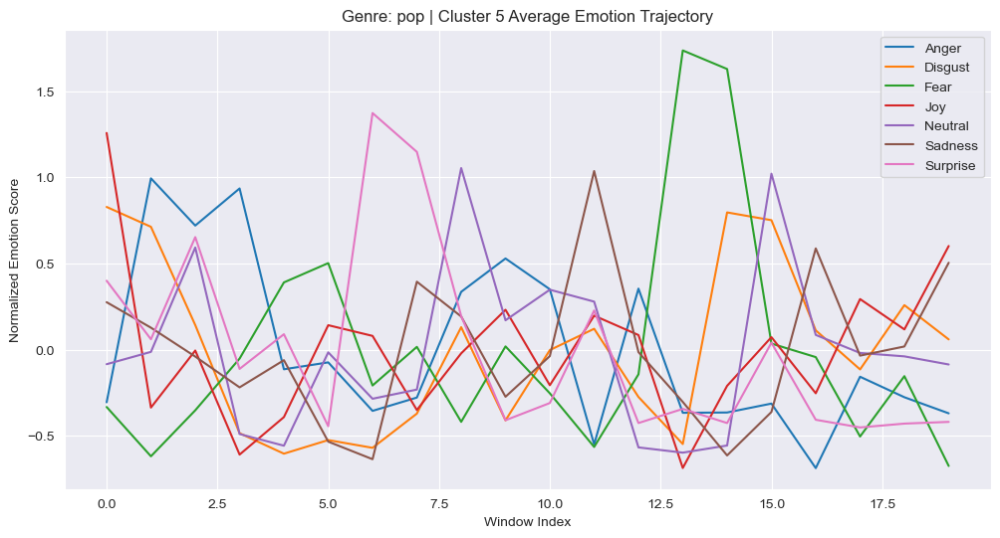

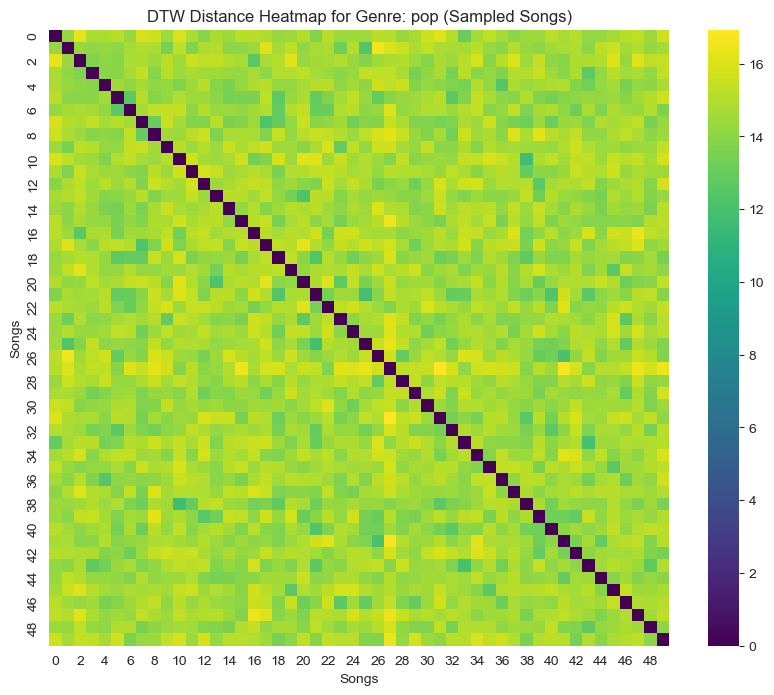

Visualizing clusters for genre: funk


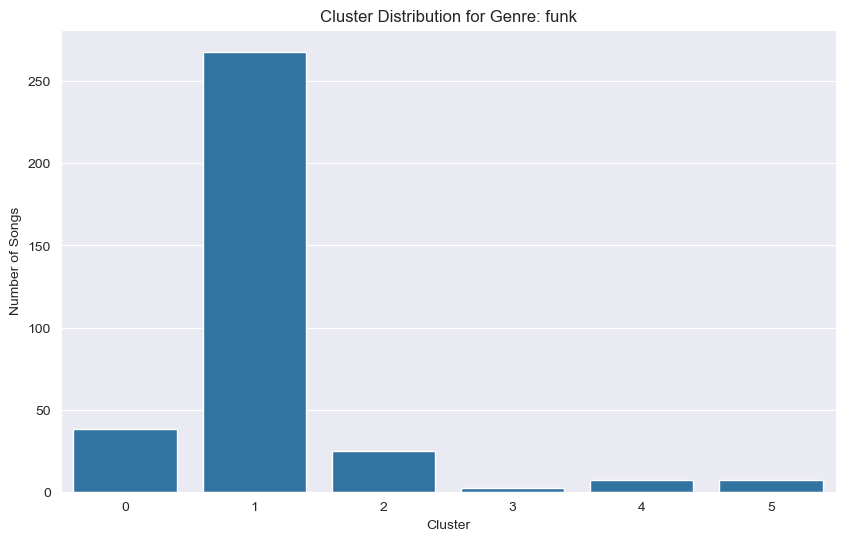

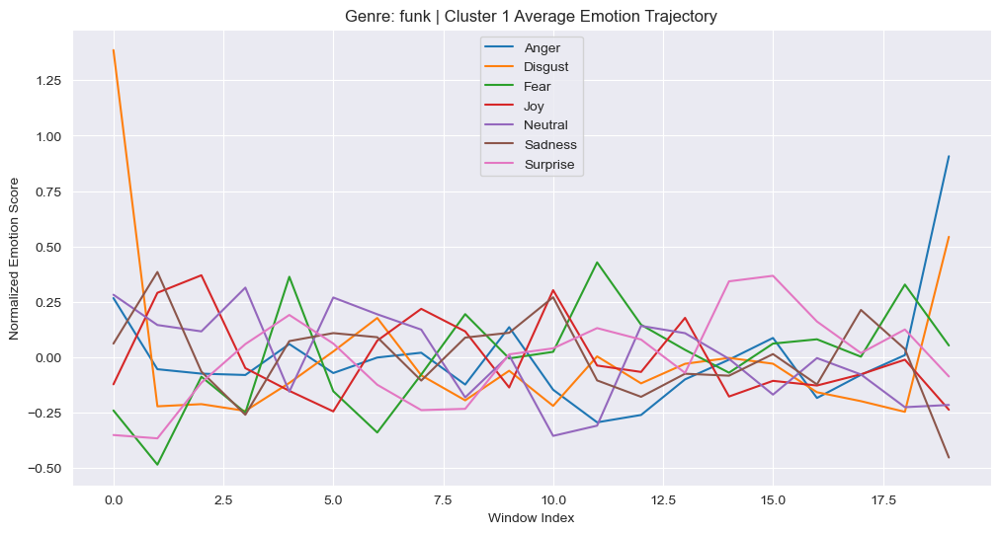

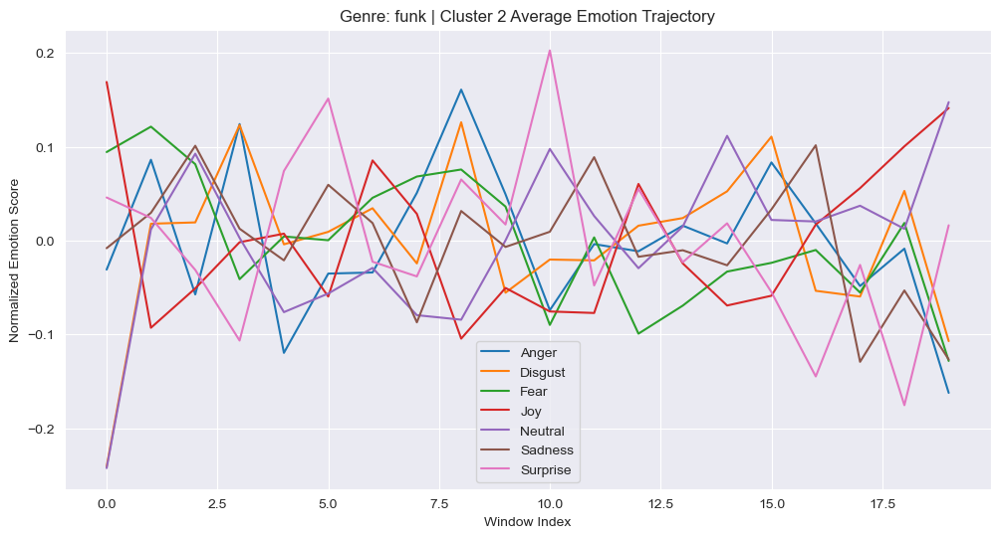

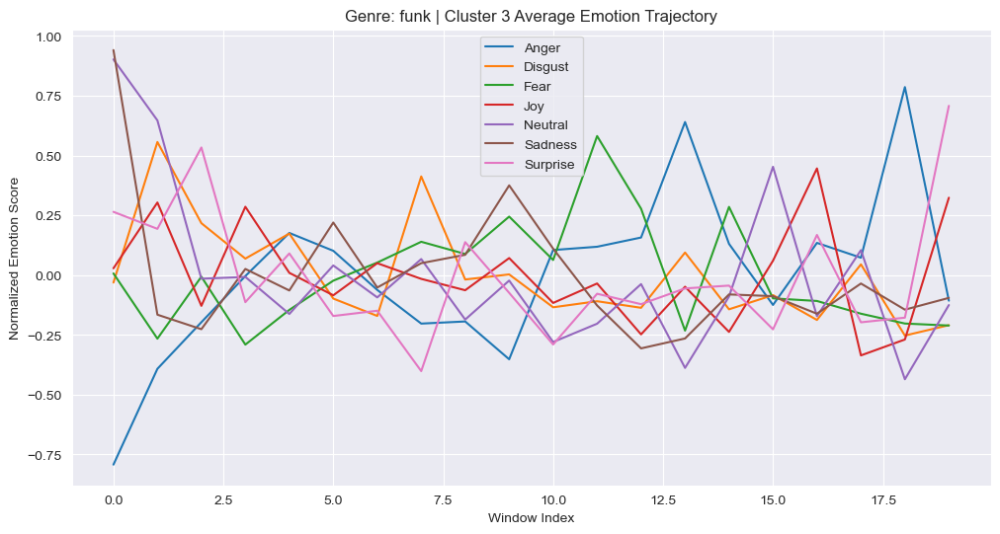

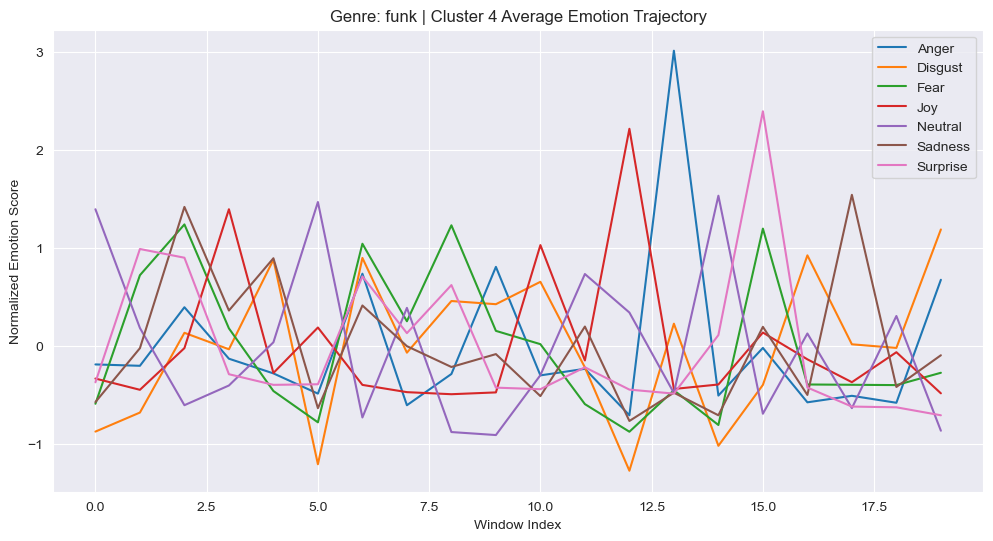

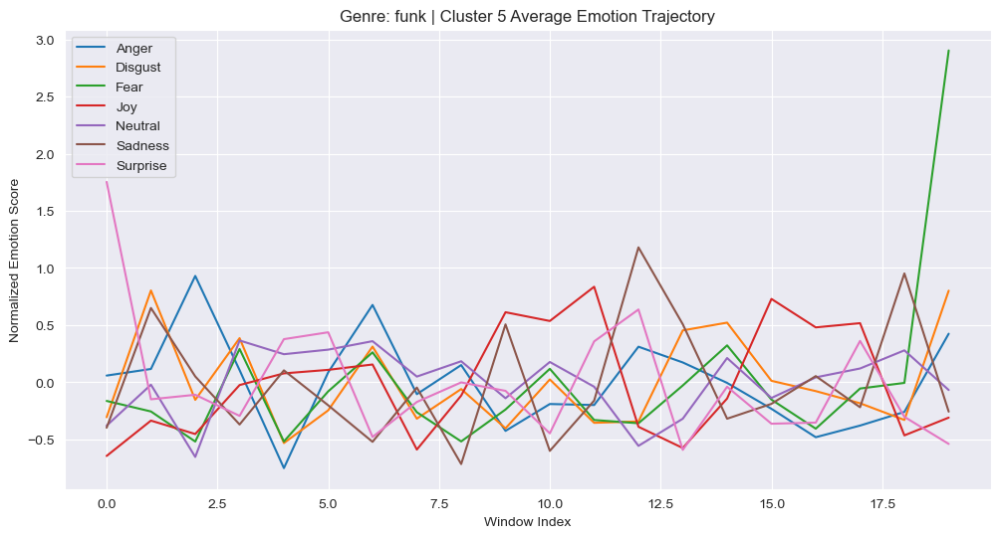

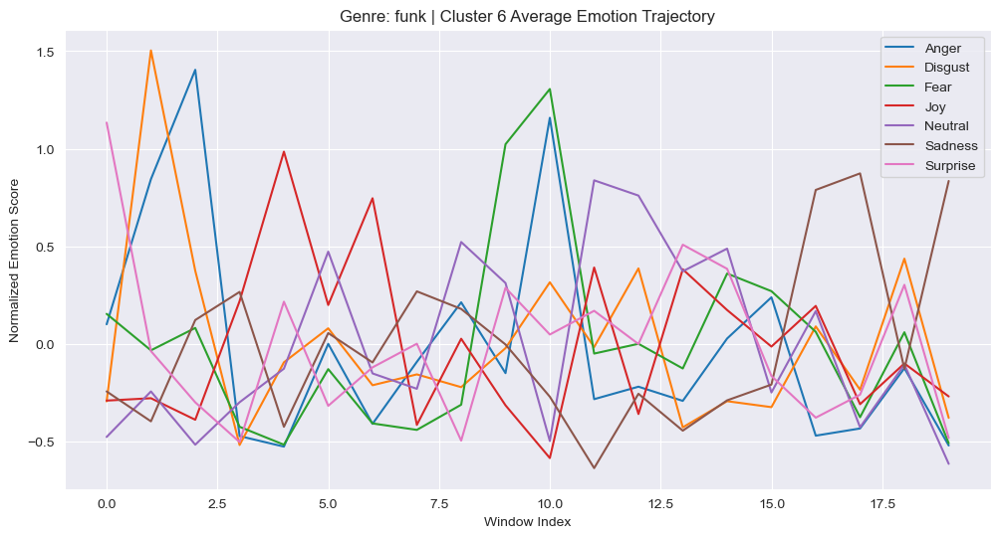

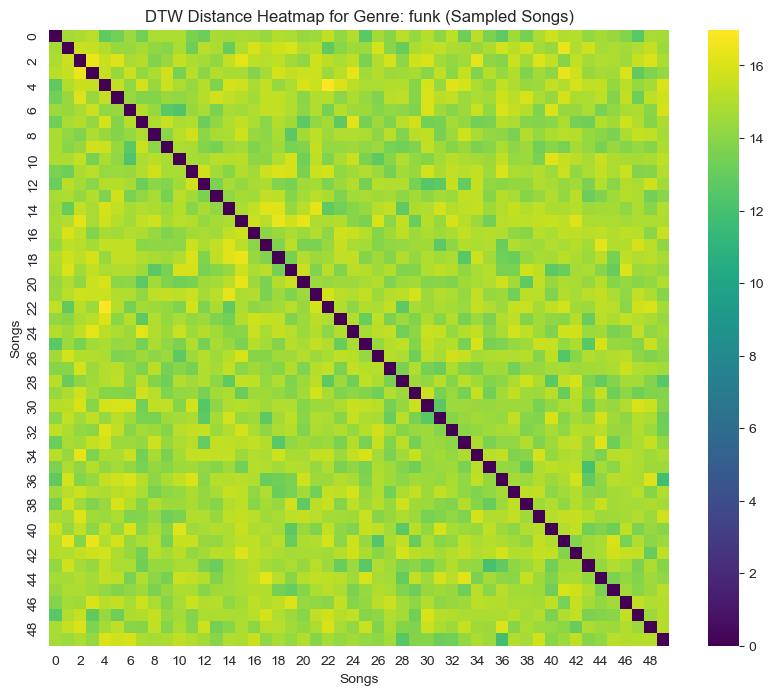

Visualizing clusters for genre: singer-songwriter


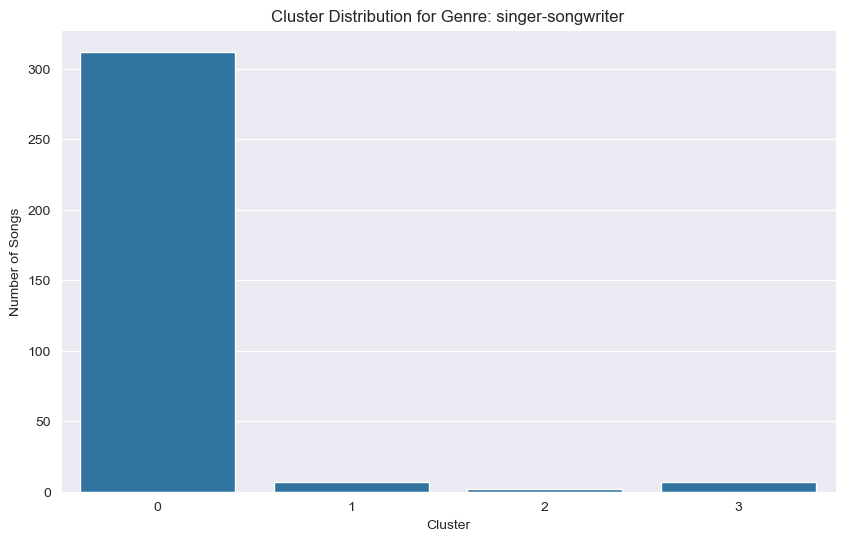

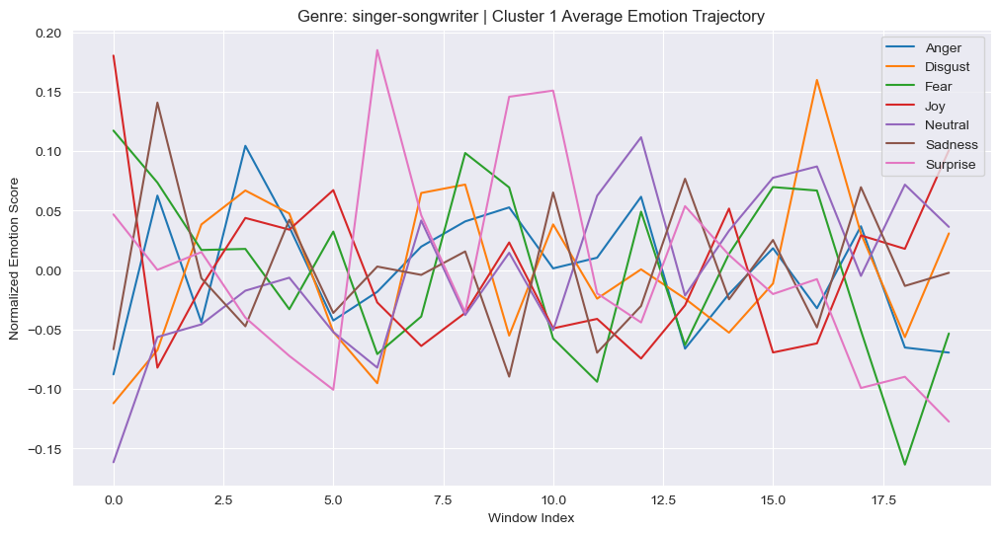

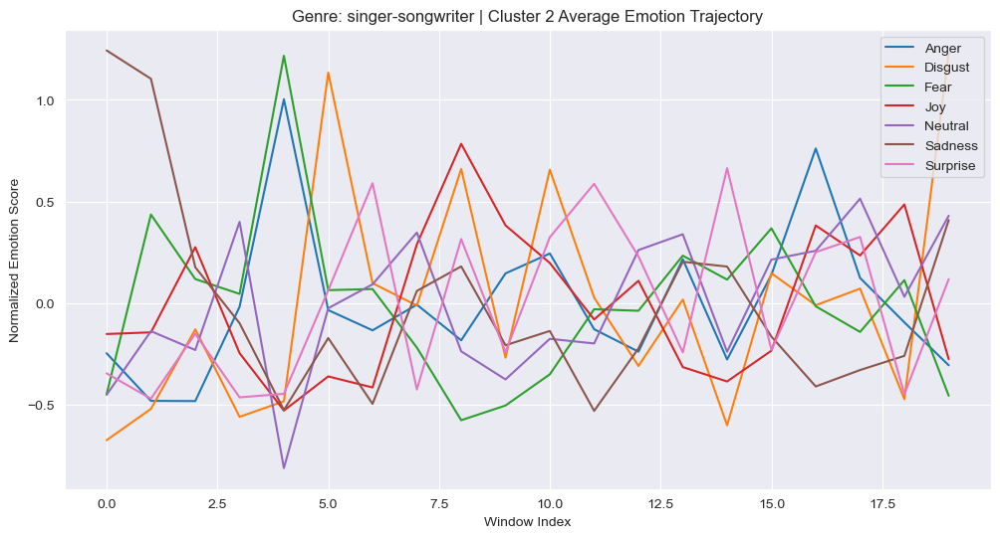

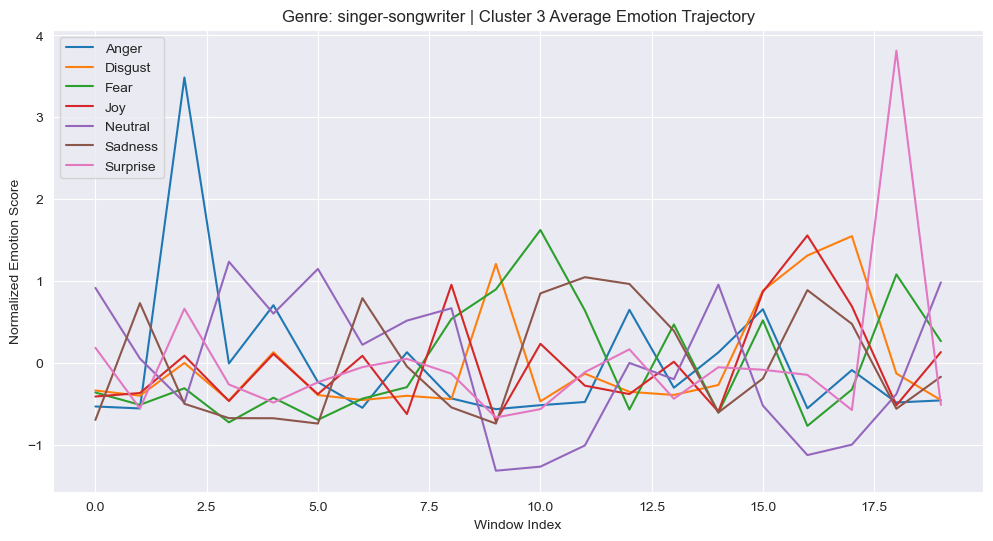

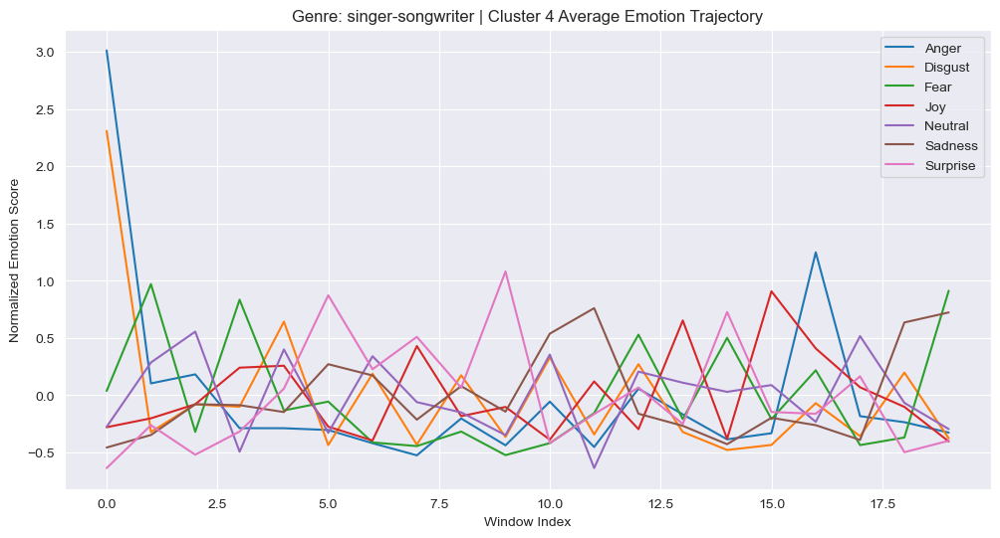

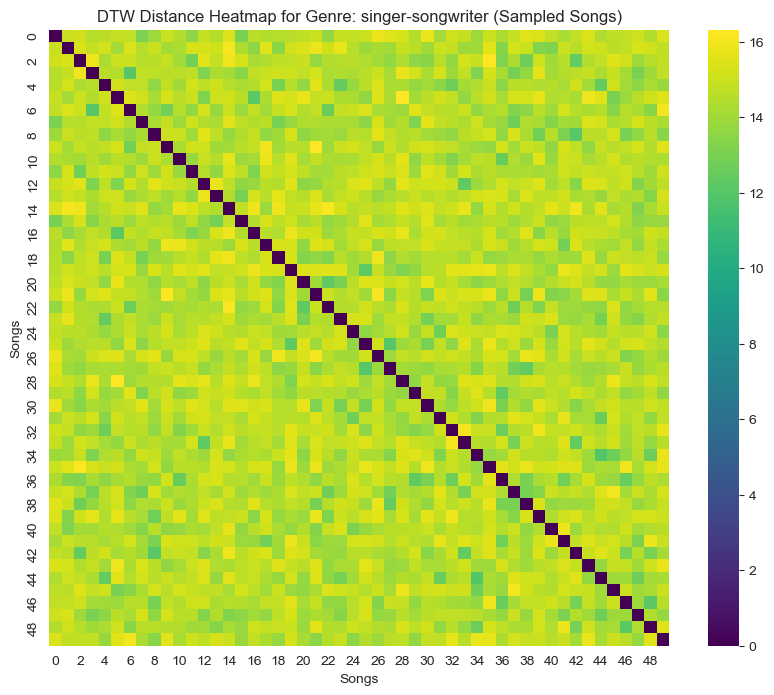

Visualizing clusters for genre: folk


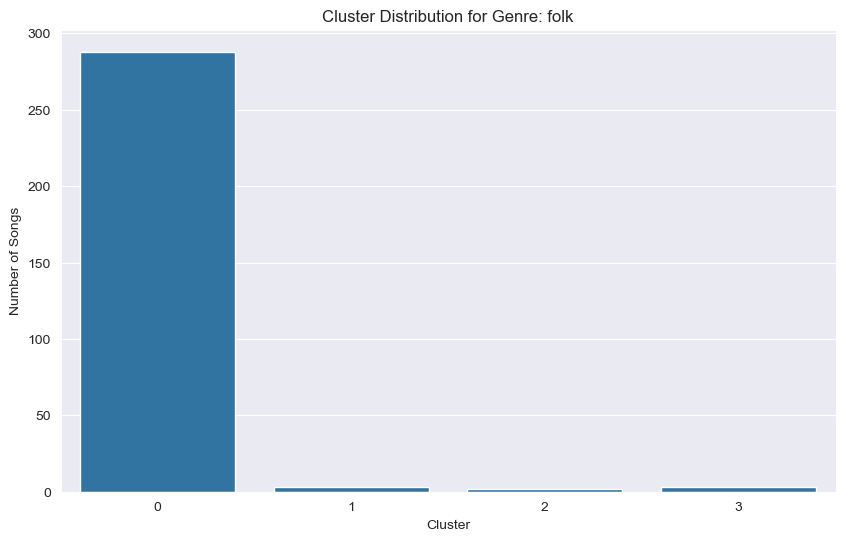

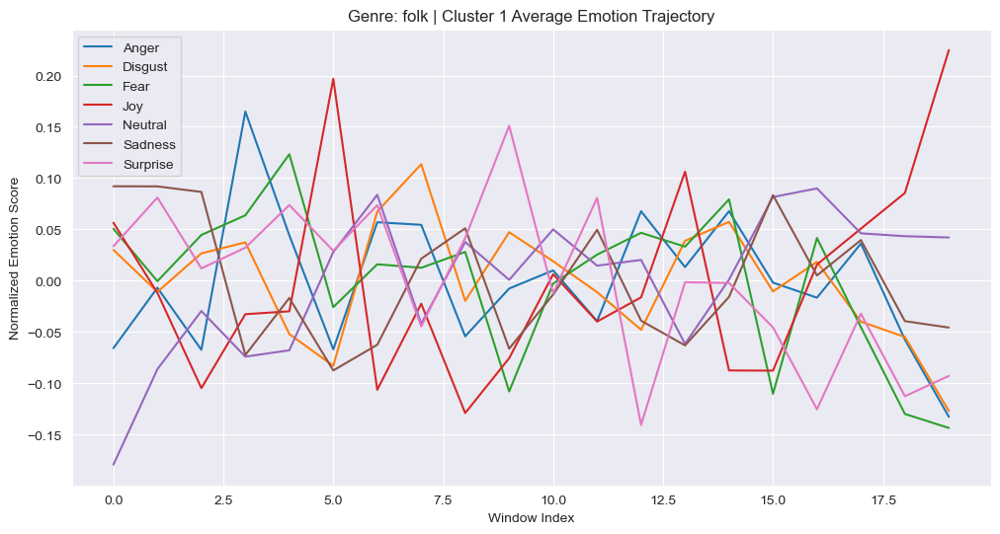

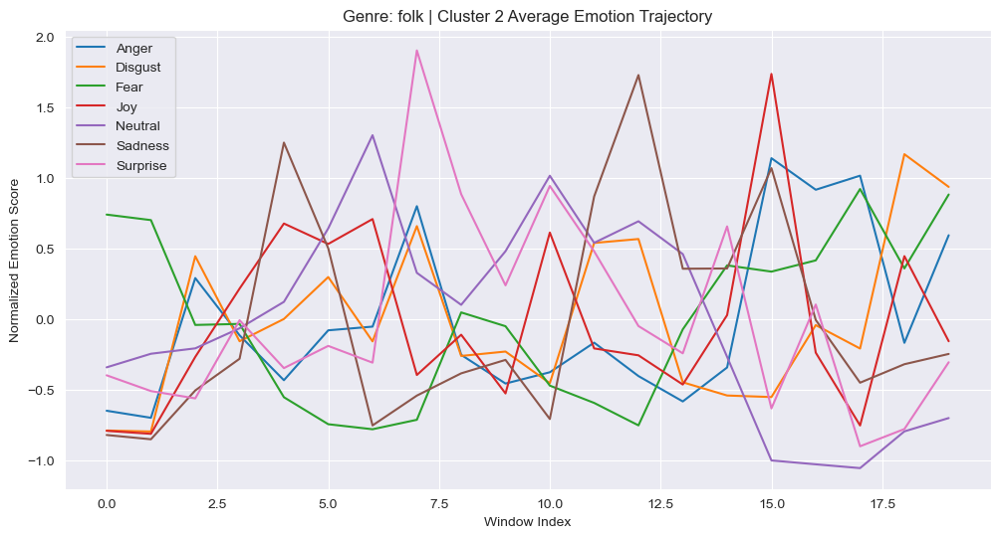

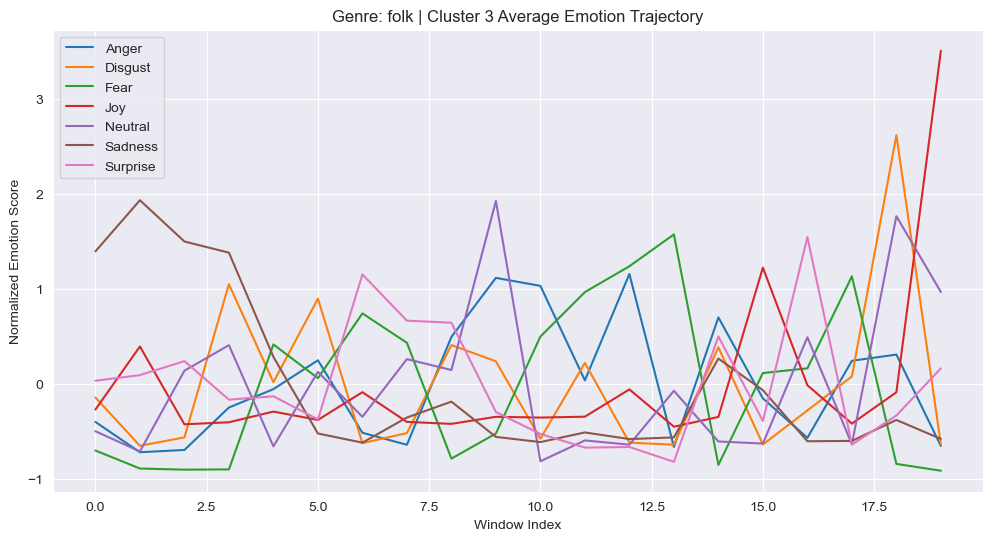

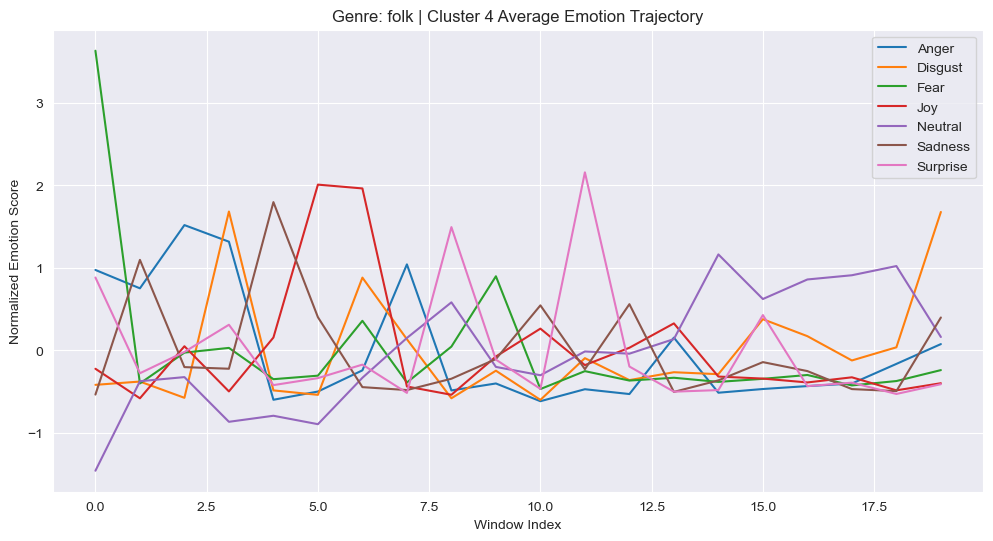

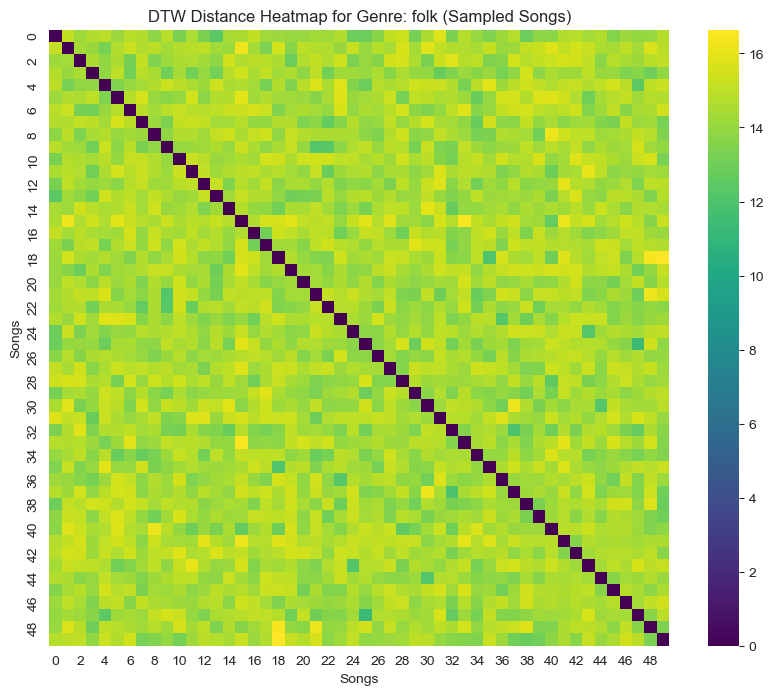

Visualizing clusters for genre: disco


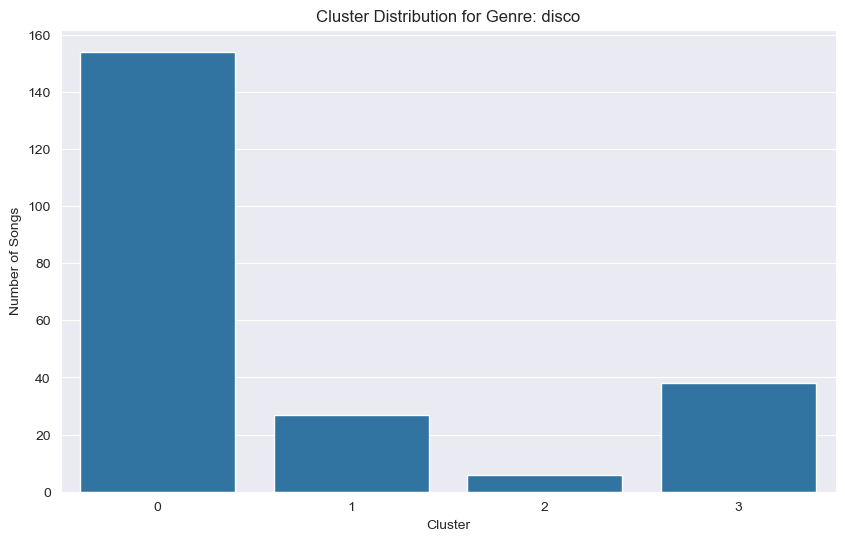

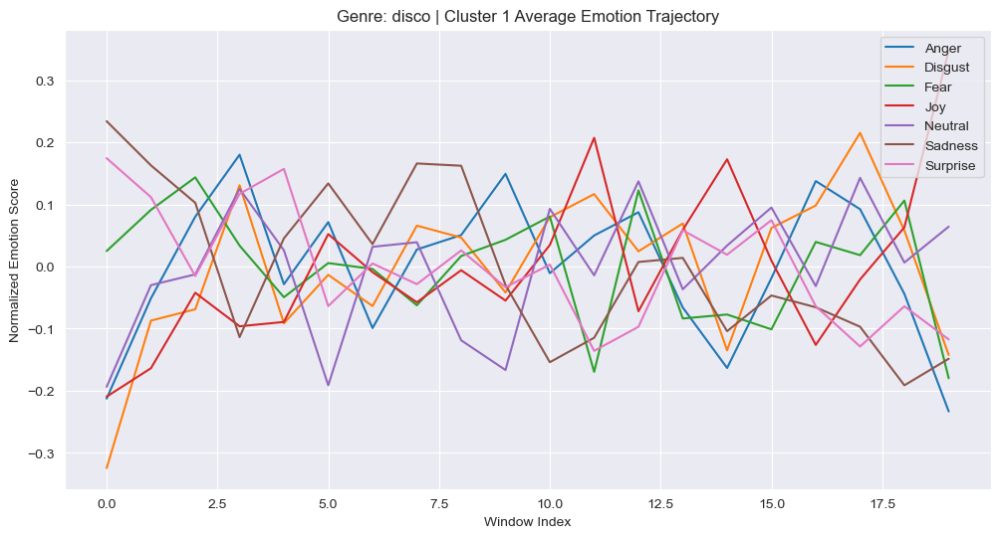

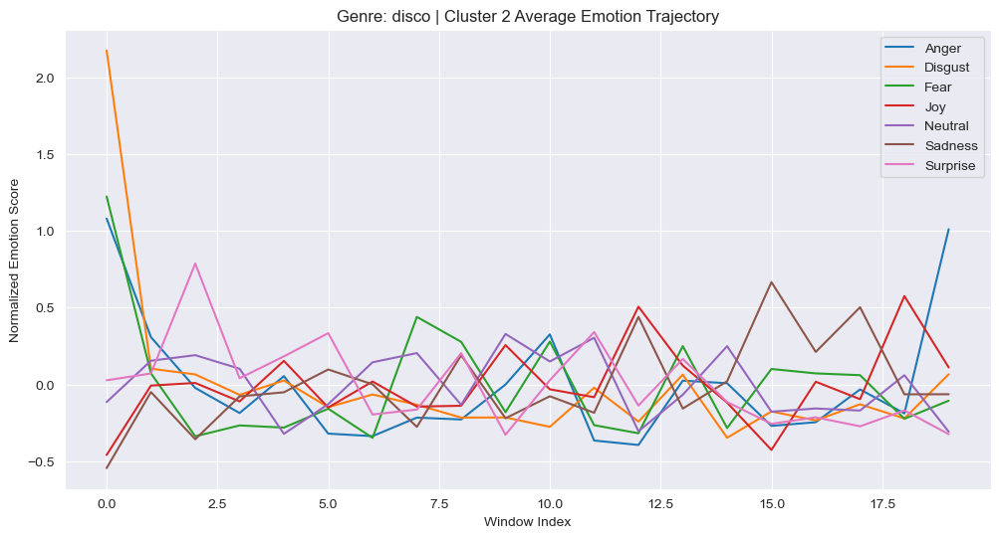

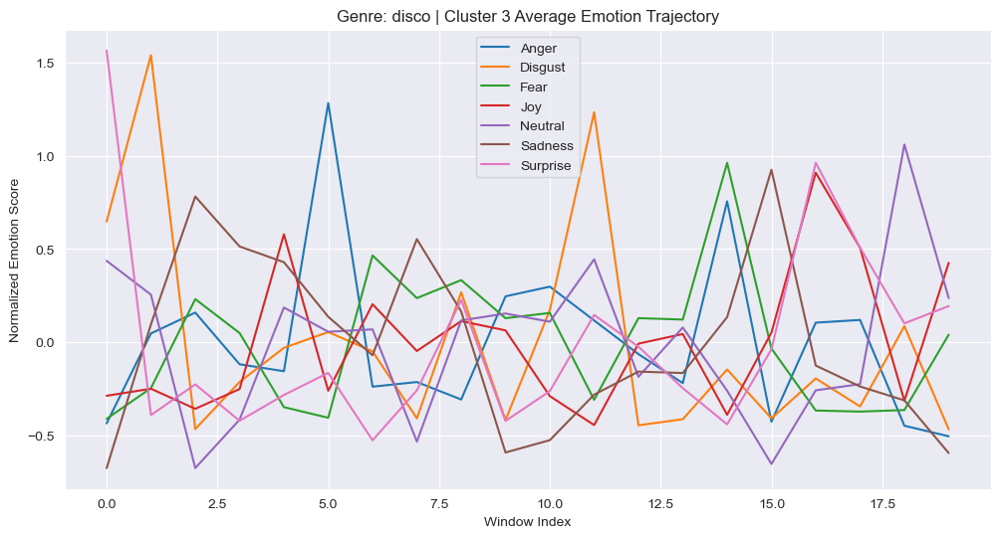

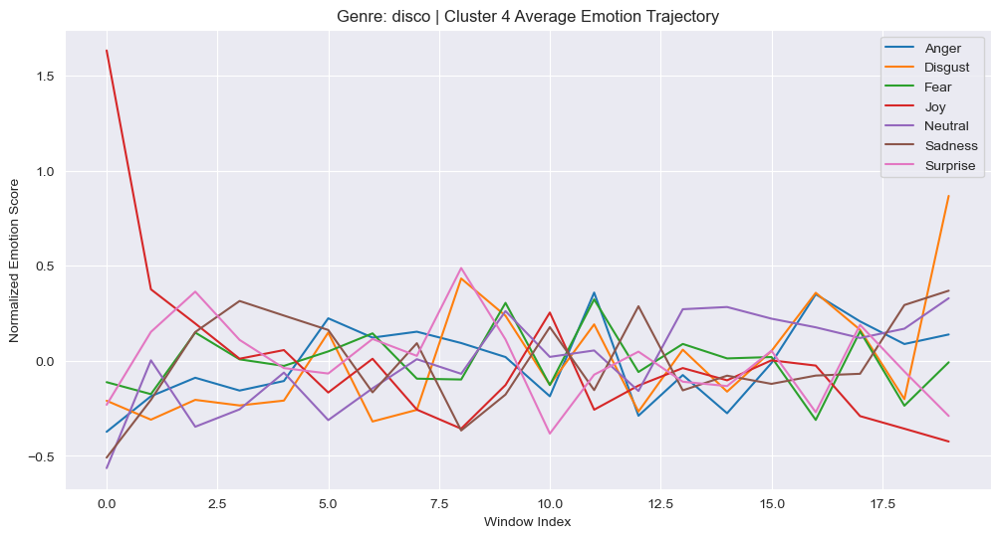

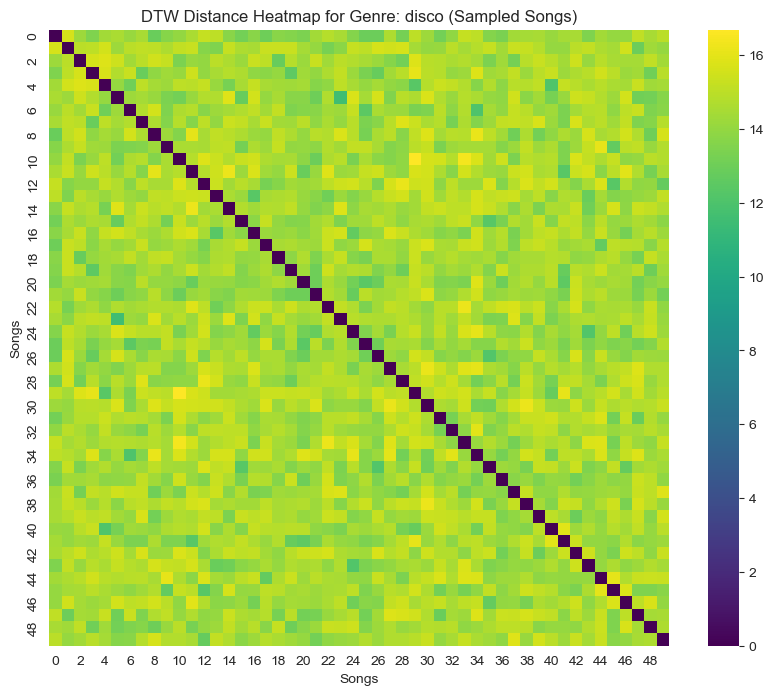

In [66]:
# Dictionaries to store data
genre_time_series = {}
genre_songs = {}
genre_distance_matrices = {}
genre_clusters = {}

# Step 1: Prepare and Normalize Time Series Data
for genre in top_genres:
    print(f"Preparing data for genre: {genre}")
    genre_df = train_df[train_df['genre'] == genre].copy()
    ts_array, songs = prepare_time_series(genre_df, sentiment_columns, n_windows=20)
    if ts_array.size == 0:
        print(f"No complete songs found for genre: {genre}")
        continue
    scaler = TimeSeriesScalerMeanVariance()
    ts_scaled = scaler.fit_transform(ts_array)
    genre_time_series[genre] = ts_scaled
    genre_songs[genre] = songs

# Step 2: Compute DTW Distance Matrices
for genre in top_genres:
    if genre not in genre_time_series:
        continue
    print(f"Computing DTW distances for genre: {genre}")
    ts_data = genre_time_series[genre]
    distance_matrix = cdist_dtw(ts_data)
    genre_distance_matrices[genre] = distance_matrix

# Step 3: Perform Clustering
for genre in top_genres:
    if genre not in genre_distance_matrices:
        continue
    print(f"Clustering songs for genre: {genre}")
    distance_matrix = genre_distance_matrices[genre]
    k_optimal = optimal_k_values.get(genre, 5)  # Default to 5 if genre not in optimal_k_values
    clustering_model = AgglomerativeClustering(
        n_clusters=k_optimal,
        metric='precomputed',
        linkage='average'
    )
    labels = clustering_model.fit_predict(distance_matrix)
    genre_clusters[genre] = labels

# Step 4: Visualization
for genre in top_genres:
    if genre not in genre_time_series or genre not in genre_clusters:
        continue
    print(f"Visualizing clusters for genre: {genre}")
    ts_data = genre_time_series[genre]
    labels = genre_clusters[genre]
    songs = genre_songs[genre]
    
    # Create a DataFrame for clustering results
    cluster_df = pd.DataFrame({
        'song_artist': songs,
        'cluster': labels
    })
    
    # Plot Cluster Distribution
    plt.figure(figsize=(10, 6))
    sns.countplot(data=cluster_df, x='cluster')
    plt.title(f'Cluster Distribution for Genre: {genre}')
    plt.xlabel('Cluster')
    plt.ylabel('Number of Songs')
    plt.show()
    
    # Plot Average Trajectories for Each Cluster
    for cluster in range(optimal_k_values[genre]):
        cluster_indices = np.where(labels == cluster)[0]
        if len(cluster_indices) == 0:
            continue
        avg_trajectory = ts_data[cluster_indices].mean(axis=0)  # Shape: (20, 7)
        plt.figure(figsize=(12, 6))
        for i, emotion in enumerate(sentiment_columns):
            plt.plot(range(20), avg_trajectory[:, i], label=emotion.capitalize())
        plt.title(f'Genre: {genre} | Cluster {cluster + 1} Average Emotion Trajectory')
        plt.xlabel('Window Index')
        plt.ylabel('Normalized Emotion Score')
        plt.legend()
        plt.show()
    
    # (Optional) Plot DTW Distance Heatmap for a Subset of Songs
    # To avoid clutter, sample a subset
    sample_size = min(50, len(labels))
    sample_indices = np.random.choice(len(labels), size=sample_size, replace=False)
    sampled_distance_matrix = genre_distance_matrices[genre][np.ix_(sample_indices, sample_indices)]
    
    plt.figure(figsize=(10, 8))
    sns.heatmap(sampled_distance_matrix, cmap='viridis')
    plt.title(f'DTW Distance Heatmap for Genre: {genre} (Sampled Songs)')
    plt.xlabel('Songs')
    plt.ylabel('Songs')
    plt.show()

In [53]:
# Now let's retry the same process but using regular clustering instead of agglomerative clustering, to force diversity in the clusters



KeyboardInterrupt: 